# <span style='color: gold'>P6 - Classifiez automatiquement des biens de consommation</span>

![logo_projet.png](logo_projet.png)

Le but de ce projet est de réaliser une première étude de faisabilité d'un moteur de classification d'articles pour une marketplace e-commerce. L'étude sera basée sur l'image et la description d'article pour l'automatisation de l'attribution de la catégorie de l'article.

Voici les contraintes : 

Afin d’extraire les features **texte**, il sera nécessaire de mettre en œuvre :
- Deux approches de type “bag-of-words”, comptage simple de mots et Tf-idf 
- Une approche de type word/sentence embedding classique avec Word2Vec (ou Glove ou FastText) 
- Une approche de type word/sentence embedding avec BERT 
- Une approche de type word/sentence embedding avec USE (Universal Sentence Encoder)
  
Afin d’extraire les features **image**, il sera nécessaire de mettre en œuvre :
- Un algorithme de type SIFT / ORB / SURF ;
- Un algorithme de type CNN Transfer Learning.

# <font color="gold">Sommaire</font> 

1. [Import Librairies](#section_1) .
2. [Dataset](#section_2) 
   - 2.1 [Categories](#section_2_1)
   - 2.2 [Pre-processing](#section_2_2).    
3. [Analyse Exploratoire](#section_3)     
   - 3.1 [Pré-traitement](#section_3_1)    
   - 3.2 [Bag Of Word](#section_3_2)      
       - 3.2.1 [Countvectorizer](#section_3_2_1)      
       - 3.2.2 [Tf-idf](#section_3_2_2)    
   - 3.3 [Word Embedding](#section_3_3)         
      - 3.3.1 [Word2Vec](#section_3_3_1)  
      - 3.3.2 [Bidirectional Encoder Representations from Transformers BERT](#section_3_3_2)    
      - 3.3.3 [Universal Sentence Encoder USE](#section_3_3_3) 
       
4. [Feature Extraction - Word & Text Embeddings](#section_4)           
   - 4.1 [BOW - Bags of words - CountVectorizer](#section_4_1)    
   - 4.2 [BOW - TfidfVectorizer](#section_4_2)   
   - 4.3 [Word2vec](#section_4_3) 
   - 4.4 [BERT](#section_4_4)
   - 4.5 [USE](#section_4_5) 
    
5. [IMAGES - Données Images](#section_5) 
    - 5.1 [Analyse des données images](#section_5_1)
    - 5.2 [Pré-traitement images](#section_5_2)
    - 5.3 [Features Extraction](#section_5_3)
        - 5.3.1 [Algorithme SIFT](#section_5_3_1)
        - 5.3.2 [Algorithme ORB](#section_5_3_2)
    - 5.4 [Convolutional Neural Networks (CNN) transfer learning](#section_5_4)
        - 5.4.1 [VGG16](#section_5_4_1)
        - 5.4.2 [VGG19](#section_5_4_2)
        - 5.4.3 [InceptionV3](#section_5_4_3)
        - 5.4.4 [Combinaison des meilleurs résultats des approches texte et image](#section_5_4_4)
        
6. [Classification Supervisée](#section_6)   
    - 6.1 [NLP : Word & Text Embeddings](#section_6_1)
        - 6.1.1 [BERT](#section_6_1_1)
           - 6.1.1.1 [RoBERTa large model(nli-mean-tokens)](#section_6_1_1_1)
        - 6.1.2 [CountVectorizer](#section_6_1_2)
        - 6.1.3 [TfIdfVectorizer](#section_6_1_3)
        - 6.1.4 [USE](#section_6_1_4)  
           - 6.1.4.1 [universal-sentence-encoder/3](#section_6_1_4_1)
    - 6.2 [Convolutional Neural Networks (CNN) transfer learning](#section_6_2)
        - 6.2.1 [VGG19](#section_6_2_1)
        - 6.2.2 [InceptionV3](#section_6_2_2)


In [1]:
# Chargement des librairies
import datetime
import time
import sys
import os
import string
import json
from datetime import datetime
from IPython.display import display, HTML
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# Réduction dimension
from sklearn.manifold import TSNE
# Traitement images
from PIL import Image as Image_PIL, ImageOps, ImageFilter
import cv2
from scipy.ndimage import gaussian_filter

import numpy as np
import pandas as pd
import fonctions_data
import texthero as hero
import cprint
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import module_name
from module_name import *


# Algorithmes de classification supervisée
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB 
from sklearn.svm import SVC
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.cluster import MiniBatchKMeans

# Feature extraction
import seaborn as sns
import sklearn
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, \
    HashingVectorizer

# Traitement de text
import texthero as hero
from texthero import preprocessing
import nltk
import gensim
from nltk.corpus import stopwords
from nltk import word_tokenize, FreqDist
from stop_words import get_stop_words
from gensim.models import Word2Vec
import multiprocessing

# Réduction dimension
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn import decomposition
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split

# BERT
import transformers
from sentence_transformers import SentenceTransformer

# USE
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import tensorflow_hub as hub
from sklearn.manifold import TSNE

# Clustering
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score
from sklearn.metrics import adjusted_rand_score, silhouette_score, homogeneity_score, recall_score, f1_score

# normalisation, encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder

# Warnings
import warnings
warnings.filterwarnings('ignore')

# Versions
print('Version des librairies utilisées :')
#print('jyquickhelper         : ' + jyquickhelper.__version__)
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Matplotlib            : ' + mpl.__version__)
print('Seaborn               : ' + sns.__version__)
print('Sklearn               : ' + sklearn.__version__)
print('Outils dataframe      : ' + fonctions_data.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.24.4
Pandas                : 1.5.3
Matplotlib            : 3.7.5
Seaborn               : 0.13.2
Sklearn               : 1.3.0
Outils dataframe      : 0.0.0
Lancé le           : 2024-04-12T16:46:57.482191
Version des librairies utilisées :
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.24.4
Pandas                : 1.5.3
Matplotlib            : 3.7.5
Seaborn               : 0.13.2
Sklearn               : 1.3.0
Outils dataframe      : 0.0.0
Lancé le           : 2024-04-12T16:46:58.059015


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\yanni\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


## <span style='background:PowderBlue' id="#section_2">2. Dataset</span>

In [2]:
# Nombre aléatoire pour la reproductibilité des résultats
seed = 21

In [37]:
# Chargement du jeu de données

data = pd.read_csv('Data/Flipkart/flipkart_com-ecommerce_sample_1050.csv')

In [38]:
# Taille : nombre de lignes/colonnes
nRow, nVar = data.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 1050 lignes et 15 variables.


In [39]:
data.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."


-------------------------------------------------------------
Type de variable pour chacune des variables



uniq_id                     object
crawl_timestamp             object
product_url                 object
product_name                object
product_category_tree       object
pid                         object
retail_price               float64
discounted_price           float64
image                       object
is_FK_Advantage_product       bool
description                 object
product_rating              object
overall_rating              object
brand                       object
product_specifications      object
dtype: object

,Nombre par type de variable,% des types de variable
object,12,80.000000
float64,2,13.330000
bool,1,6.670000


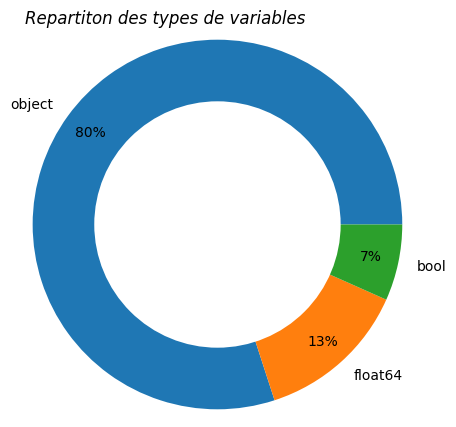

In [10]:
# Types des variables
fonctions_data.affichage_types_var(data, True, True, True)

In [11]:
# Résumé des variables qualitatives
fonctions_data.detail_type_var(data, type_var='cat')

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
type,object,object,object,object,object,object,object,bool,object,object,object,object,object
nb_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,338.0,1.0
%_nan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,32.190476,0.095238
count,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,712,1049
unique,1050,149,1050,1050,642,1050,1050,2,1050,27,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",CRNEG7BKMFFYHQ8Z,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va..."
freq,1,150,1,1,56,1,1,993,1,889,889,11,22


In [2]:
# Résumé des variables qualitatives
fonctions_data.detail_type_var(data, type_var='num')

Valeurs manquantes :341 NaN pour 15750 données (2.17 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes
brand,338,32.19
retail_price,1,0.10
discounted_price,1,0.10
product_specifications,1,0.10


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


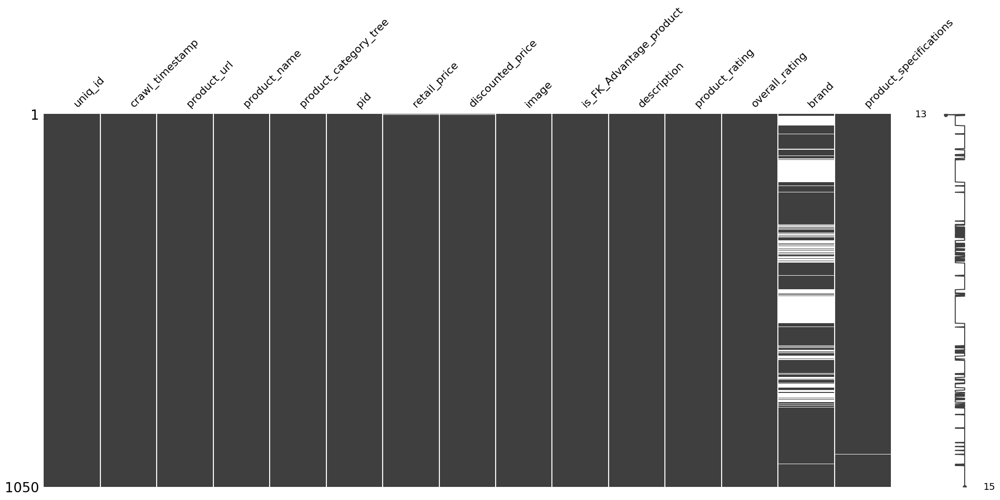

In [16]:
# Visualisation des données manquantes dans le dataset
fonctions_data.get_val_manq(data, True, True)

### <span style='background:orange'>2.1 Catégories</span>

In [40]:
# Sample checking

data['product_category_tree'][843]

'["Computers >> Laptop Accessories >> USB Gadgets >> Epresent USB Gadgets"]'

In [41]:
# Nombre de catégories en profondeur

ser_depth = data['product_category_tree'].apply(lambda x: x.count('>>'))
max_depth = ser_depth.max()
max_depth

6

In [42]:
name_level_cols = ['cat_level_'+str(i) for i in np.arange(max_depth)]
ser_tuple = data['product_category_tree']\
    .apply(lambda s: fonctions_data.str_cleaning(s.index, s, name_level_cols))
df_cat_level = pd.DataFrame([[a,'/'.join([a,b]),'/'.join([a,b,c]),
                              '/'.join([a,b,c,d]),'/'.join([a,b,c,d,e]),
                              '/'.join([a,b,c,d,e,f])] \
                             for a,b,c,d,e,f in ser_tuple.values],
                            columns=name_level_cols, index=data.index)

In [43]:
# printing number of categories in each level and a sample
display(df_cat_level.nunique(), df_cat_level.sample(3))

cat_level_0      7
cat_level_1     62
cat_level_2    243
cat_level_3    460
cat_level_4    596
cat_level_5    633
dtype: int64

,cat_level_0,cat_level_1,cat_level_2,cat_level_3,cat_level_4,cat_level_5
1020,Home Furnishing,Home Furnishing/Curtains & Accessories,Home Furnishing/Curtains & Accessories/Curtains,Home Furnishing/Curtains & Accessories/Curtain...,Home Furnishing/Curtains & Accessories/Curtain...,Home Furnishing/Curtains & Accessories/Curtain...
640,Baby Care,Baby Care/Infant Wear,Baby Care/Infant Wear/Baby Girls' Clothes,Baby Care/Infant Wear/Baby Girls' Clothes/Inne...,Baby Care/Infant Wear/Baby Girls' Clothes/Inne...,Baby Care/Infant Wear/Baby Girls' Clothes/Inne...
574,Watches,Watches/Wrist Watches,Watches/Wrist Watches/Neo Classic Wrist Watches,Watches/Wrist Watches/Neo Classic Wrist Watches/,Watches/Wrist Watches/Neo Classic Wrist Watches//,Watches/Wrist Watches/Neo Classic Wrist Watche...


**Visualisation des des produits par catégorie**

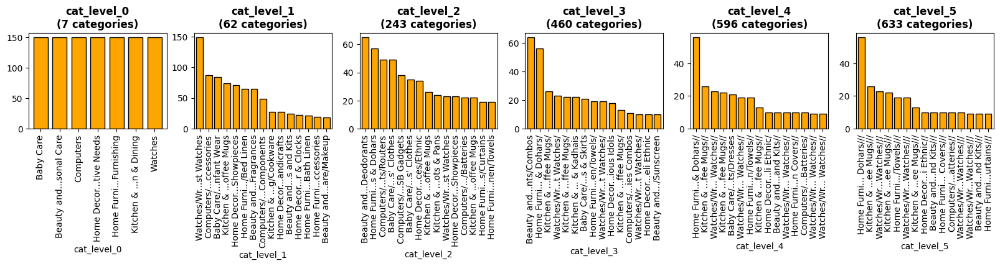

In [10]:
shorten_label = 10
n_first = 15
fig = plt.figure(figsize=(20,2))
for i, col in enumerate(df_cat_level.columns,1):
    # plot the graphs
    ax = fig.add_subplot(1,len(df_cat_level.columns), i)
    ser = df_cat_level.groupby(col).size().sort_values(ascending=False)
    ser[0:n_first].plot.bar(width=0.75, color='orange', ec='k', ax=ax)
    # shorten the labels
    thr = int(shorten_label)
    lab_x = [item.get_text() for item in ax.get_xticklabels()]
    short_lab_x = [s[:thr]+'...'+s[-thr:] if len(s)>thr else s for s in lab_x]
    ax.axes.set_xticklabels(short_lab_x)
    # set title
    ax.set_title(col+f'\n({ser.shape[0]} categories)', fontweight='bold')

- Les sous-catégories sont comprises entre 2 au minimum et 7 au maximum.
- La plupart des produits ont entre 3 et 5 sous-niveaux.
- Le premier niveau comporte 7 catégories ayant chacune 150 images.
- Les autres niveaux comportent de nombreuses catégories ayant moins de 10 images, ce qui est bien insuffisant pour pouvoir correctement catégoriser ces niveaux en automatique. 

**Le niveau 1 des catégories sera utilisé pour la suite de l'analyse.**

Le seul niveau qui présente un ensemble équilibré d'objets est le niveau 0, avec 7 catégories. Renommons ces 7 catégories

In [60]:
df_cat_level['category'] = \
    df_cat_level['cat_level_0'].replace({'Home Furnishing': 'Furnishing',
                                         'Baby Care': 'Baby', 
                                         'Watches': 'Watches',
                                         'Home Decor & Festive Needs': 'Decor',
                                         'Kitchen & Dining': 'Kitchen',
                                         'Beauty and Personal Care': 'Beauty',
                                         'Computers': 'Computers'})

**Descriptions des catégories utiles avec le champ 'category'**

In [61]:
# Extract only useful data

data_work = pd.concat([df_cat_level['category'],
                         data[['product_name', 'brand', 'image', 'product_category_tree',
                  'description', 'product_specifications']]], axis=1)

In [62]:
data_work.head(2)

,category,product_name,brand,image,product_category_tree,description,product_specifications
0,Furnishing,Elegance Polyester Multicolor Abstract Eyelet ...,Elegance,55b85ea15a1536d46b7190ad6fff8ce7.jpg,"[""Home Furnishing >> Curtains & Accessories >>...",Key Features of Elegance Polyester Multicolor ...,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,Baby,Sathiyas Cotton Bath Towel,Sathiyas,7b72c92c2f6c40268628ec5f14c6d590.jpg,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",Specifications of Sathiyas Cotton Bath Towel (...,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [63]:
data_work.loc[77]['product_name']

'Giorgio Armani SMOOTH SILK LIP PENCIL 12'

In [64]:
data_work.loc[77]['description']

'Giorgio Armani SMOOTH SILK LIP PENCIL 12 (Soyeux 12) Price: Rs. 1,710 Glides on smoothly and defines the look of your lips with gorgeous colour.,Specifications of Giorgio Armani SMOOTH SILK LIP PENCIL 12 (Soyeux 12) Lip Liner Details Dual-tipped No Shade Soyeux 12 Waterproof No Smudge-free No Size 1.14 In the Box 1 Lip Pencil'

In [65]:
data_work.loc[77]['product_specifications']

'{"product_specification"=>[{"key"=>"Dual-tipped", "value"=>"No"}, {"key"=>"Shade", "value"=>"Soyeux 12"}, {"key"=>"Waterproof", "value"=>"No"}, {"key"=>"Smudge-free", "value"=>"No"}, {"key"=>"Size", "value"=>"1.14"}, {"value"=>"1 Lip Pencil"}]}'

In [66]:
data_work.loc[77]['brand']

'Giorgio Armani'

In [67]:
# creation d'un corpus de toutes les descriptions
corpus = ' '.join(data_work['description'].values)
print("total nb of words in the whole corpus: ", len(corpus.split()))

total nb of words in the whole corpus:  80013


In [68]:
# Encoage des categories
lab_encod = LabelEncoder()
data_work["label"] = lab_encod.fit_transform(data_work["category"])
cat_code = data_work["label"].to_list()

### <span style='background:orange'>2.2 Pré-processing</span>

In [69]:
# Stopwords et lettres simples
english_sw = nltk.corpus.stopwords.words('english')
single_let_sw = list(string.ascii_lowercase)
sw = list(set(english_sw + single_let_sw))

In [18]:
#import spacy.cli 
#spacy.cli.download("en_core_web_md")

In [70]:
# Racinisation ou lemmatisation
from nltk.stem.snowball import EnglishStemmer
import spacy
import spacy.cli

stemmer = EnglishStemmer()
#lemmatizer = spacy.load('en', disable=['parser', 'ner'])
lemmatizer = spacy.cli.download("en_core_web_md")

✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_md')


**Fonction de nettoyage (Lemmatisation, Stemmatisation)**

In [71]:
data_work['brand'] = data_work['brand'].apply(str) 
data_work['product_specifications'] = data_work['product_specifications'].apply(str)

In [72]:
# Fonctiion de transformation (nettoyage de tokenisation) sur les produits et descriptions

data_work['desc_clean'] = \
    data_work['description'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=None,
                                                    lemmatizer=None))\
                               .apply(lambda x: ' '.join(x))

data_work['pname_clean'] = \
    data_work['product_name'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=None,
                                                    lemmatizer=None))\
                              .apply(lambda x: ' '.join(x))

data_work['brand_clean'] = \
    data_work['brand'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=None,
                                                    lemmatizer=None))\
                              .apply(lambda x: ' '.join(x))

data_work['prod_spec_clean'] = \
    data_work['product_specifications'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=None,
                                                    lemmatizer=None))\
                              .apply(lambda x: ' '.join(x))

In [73]:
data_work.loc[79, 'product_name']

'florence9 baby cap red checks Cap'

In [74]:
data_work.loc[79, 'pname_clean']

'florence baby cap red cap'

In [75]:
data_work.loc[79, 'desc_clean']

'key florence baby cap red red florence baby cap red cap number pack fabric cotton type baby cap red general casual ideal baby boy baby girl additional style code baby cap red'

**Lemmatisation - noms produits, description, et brand**

In [76]:
# Fonction de transformation: lemmatisation sur les produits et descriptions

data_work['desc_lem'] = \
    data_work['description'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=None,
                                                    lemmatizer=lemmatizer))\
                               .apply(lambda x: ' '.join(x))

data_work['pname_lem'] = \
    data_work['product_name'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=None,
                                                    lemmatizer=lemmatizer))\
                              .apply(lambda x: ' '.join(x))

data_work['brand_lem'] = \
    data_work['brand'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=None,
                                                    lemmatizer=lemmatizer))\
                              .apply(lambda x: ' '.join(x))

data_work['prod_spec_lem'] = \
    data_work['product_specifications'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=None,
                                                    lemmatizer=lemmatizer))\
                              .apply(lambda x: ' '.join(x))

**Racinisation - noms produits, description, et brand**

In [77]:
# Fonction de transformation: racinisation sur les produits et descriptions

data_work['desc_stem'] = \
    data_work['description'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=stemmer,
                                                    lemmatizer=None))\
                               .apply(lambda x: ' '.join(x))

data_work['pname_stem'] = \
    data_work['product_name'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=stemmer,
                                                    lemmatizer=None))\
                              .apply(lambda x: ' '.join(x))

data_work['brand_stem'] = \
    data_work['brand'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=stemmer,
                                                    lemmatizer=None))\
                              .apply(lambda x: ' '.join(x))

data_work['prod_spec_stem'] = \
    data_work['product_specifications'].apply(lambda x: \
                                     fonctions_data.tokenize_clean(x,
                                                    stopwords=sw,
                                                    keep_tags=['NN','JJ'],
                                                    stemmer=stemmer,
                                                    lemmatizer=None))\
                              .apply(lambda x: ' '.join(x))

In [78]:
data_work[['prod_spec_clean', 'prod_spec_stem',
           'prod_spec_lem']].head(5)

,prod_spec_clean,prod_spec_stem,prod_spec_lem
0,product specification key brand value elegance...,product specif key brand valu eleg key valu do...,product specification key brand value elegance...
1,product specification key machine washable val...,product specif key machin washabl valu key mat...,product specification key machine washable val...
2,product specification key material value cotto...,product specif key materi valu cotton key desi...,product specification key material value cotto...
3,product specification key brand value royal fa...,product specif key brand valu royal fashion ke...,product specification key brand value royal fa...
4,product specification key machine washable val...,product specif key machin washabl valu key bra...,product specification key machine washable val...


In [79]:
data_work.to_csv('data_work.csv')

## <span style='background:PowderBlue'>3. Analyse exploratoire</span>

Comparaons les fréquences des mots les plus fréquents

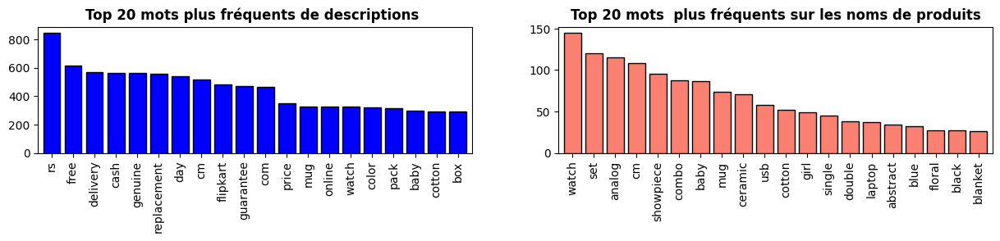

In [30]:
# création d'un corpus sur les decriptions et produits netoyées
corpus_desc = ' '.join(data_work['desc_clean'].values)
corpus_pname = ' '.join(data_work['pname_clean'].values)

# tokenisation des mots sur le corpus néttoyé
tokenizer = nltk.RegexpTokenizer(r'[a-z]+')
li_words_desc = tokenizer.tokenize(corpus_desc.lower())
li_words_pname = tokenizer.tokenize(corpus_pname.lower())

# Comptage de le fréquence de chaque mot
ser_freq_desc = pd.Series(nltk.FreqDist(li_words_desc))
ser_freq_pname = pd.Series(nltk.FreqDist(li_words_pname))

fig = plt.figure(figsize=(15,2))

# Graphe des mots les plus fréquents
ax = fig.add_subplot(1,2,1)
ser_freq_desc.sort_values(ascending=False)[0:20].plot.bar(width=0.8,
                                                          color='blue',
                                                          ec='k',
                                                          ax=ax)
ax.set_title("Top 20 mots plus fréquents de descriptions ", fontweight='bold')
ax = fig.add_subplot(1,2,2)
ser_freq_pname.sort_values(ascending=False)[0:20].plot.bar(width=0.8,
                                                           color='salmon',
                                                           ec='k',
                                                           ax=ax)
ax.set_title("Top 20 mots  plus fréquents sur les noms de produits", fontweight='bold')
plt.show()

**WordCloud par catégorie**

Visualisation des mots les plus fréquents pour chacune des 7 catégories après le pré-traitement de la variable 'description'

Mots les plus fréquents de la catégorie : Furnishing


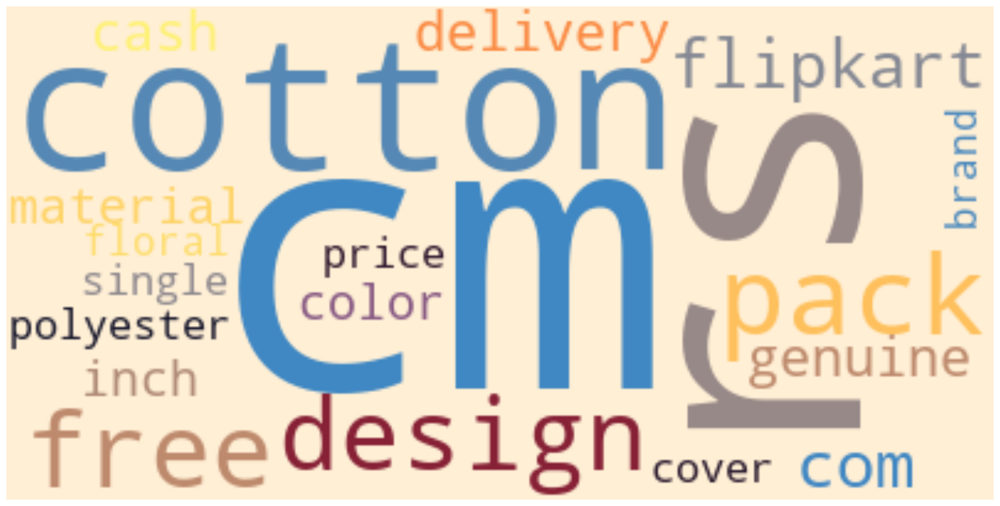

Mots les plus fréquents de la catégorie : Baby


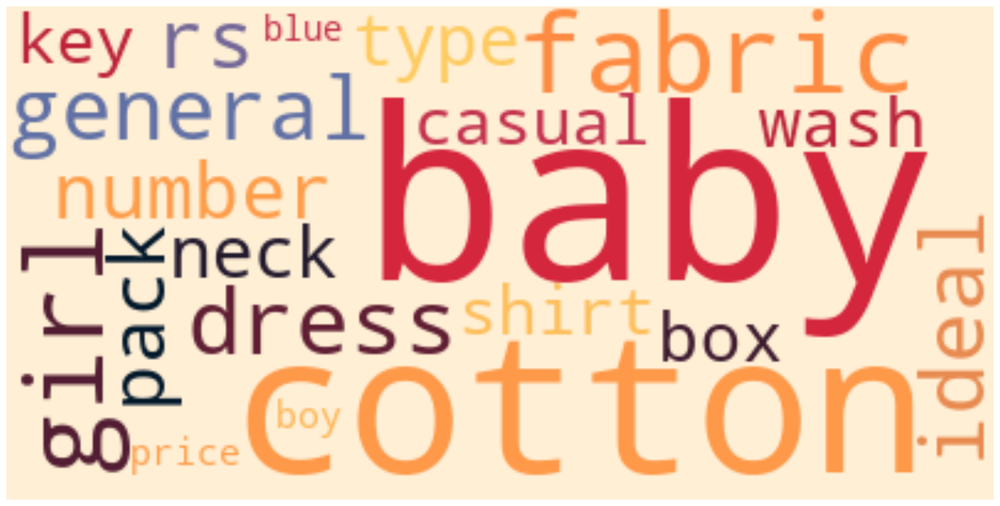

Mots les plus fréquents de la catégorie : Watches


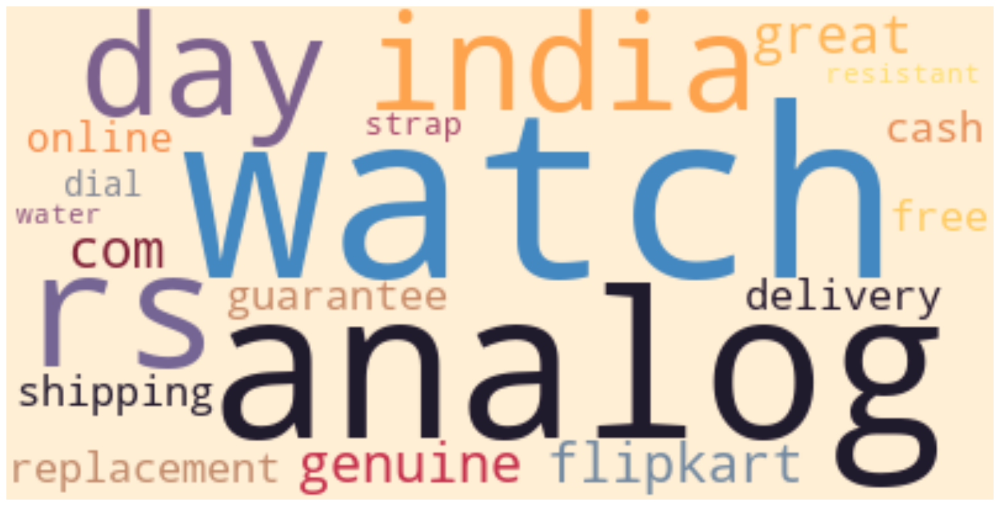

Mots les plus fréquents de la catégorie : Decor


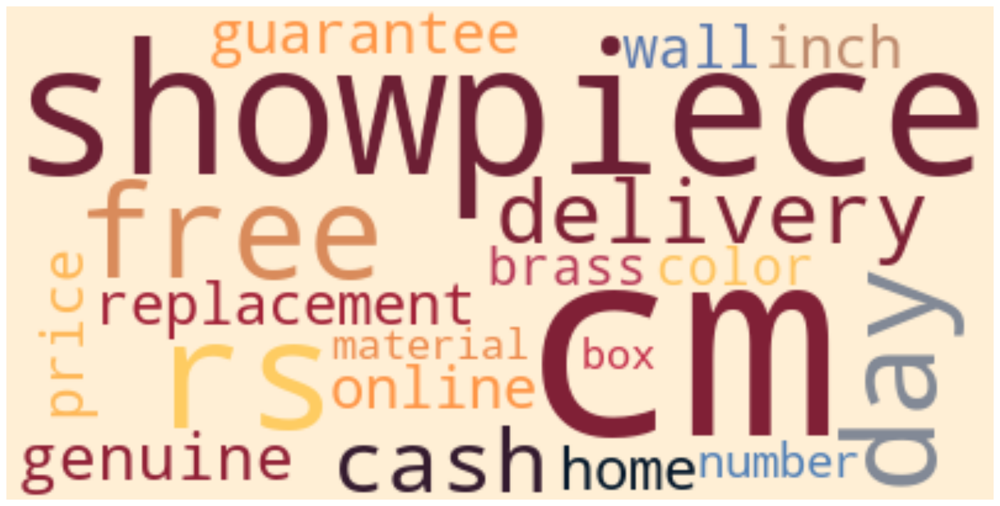

Mots les plus fréquents de la catégorie : Kitchen


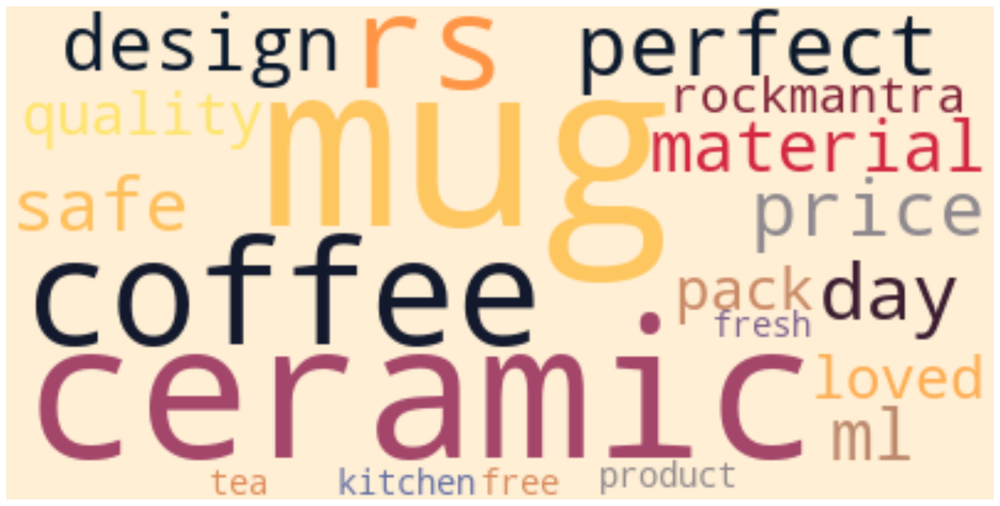

Mots les plus fréquents de la catégorie : Beauty


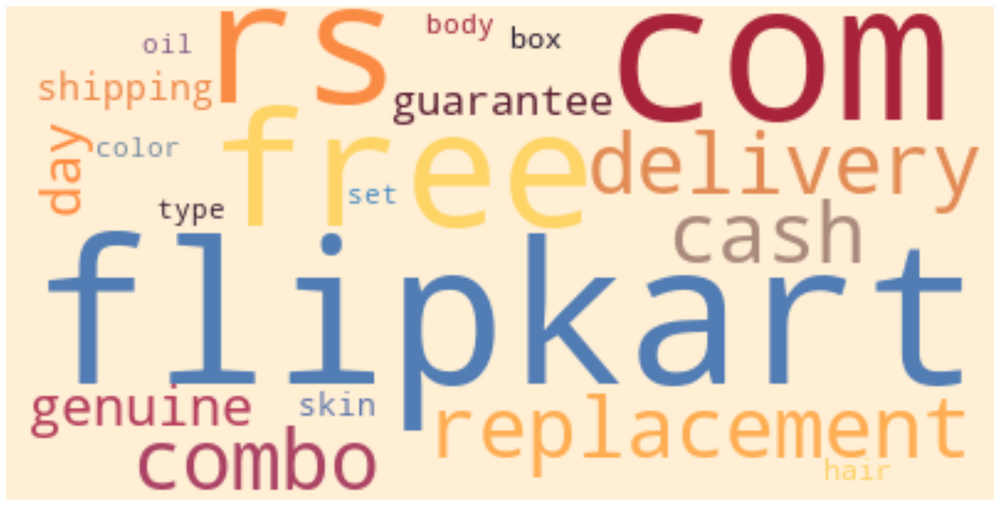

Mots les plus fréquents de la catégorie : Computers


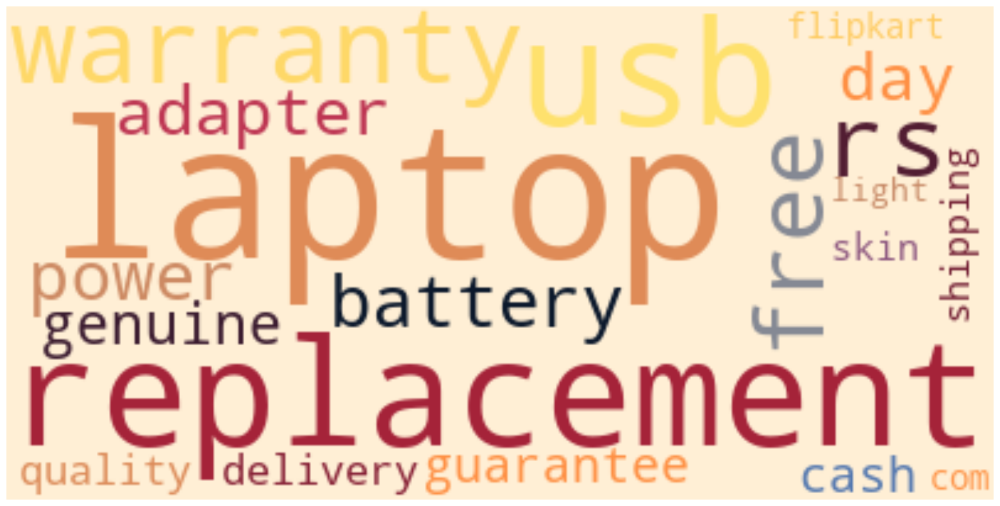

In [173]:
fonctions_data.affiche_wordcloud_hue(df_desc_cat, 'desc_clean',
                                  'category', 20)

Mots les plus fréquents de la catégorie : Furnishing


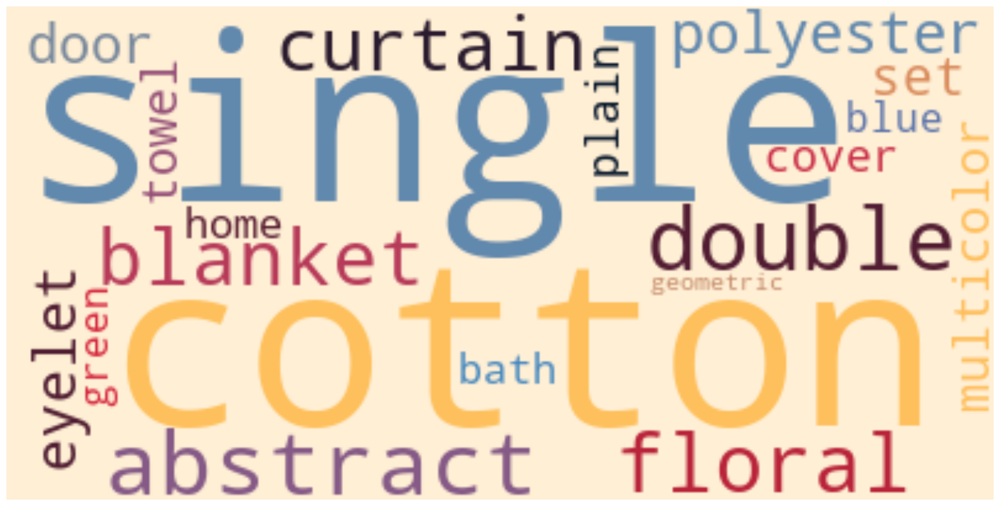

Mots les plus fréquents de la catégorie : Baby


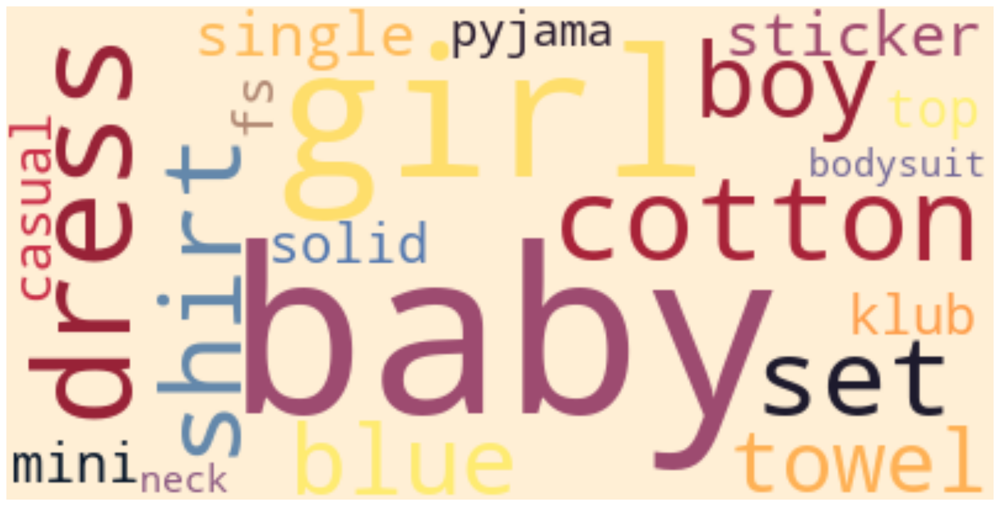

Mots les plus fréquents de la catégorie : Watches


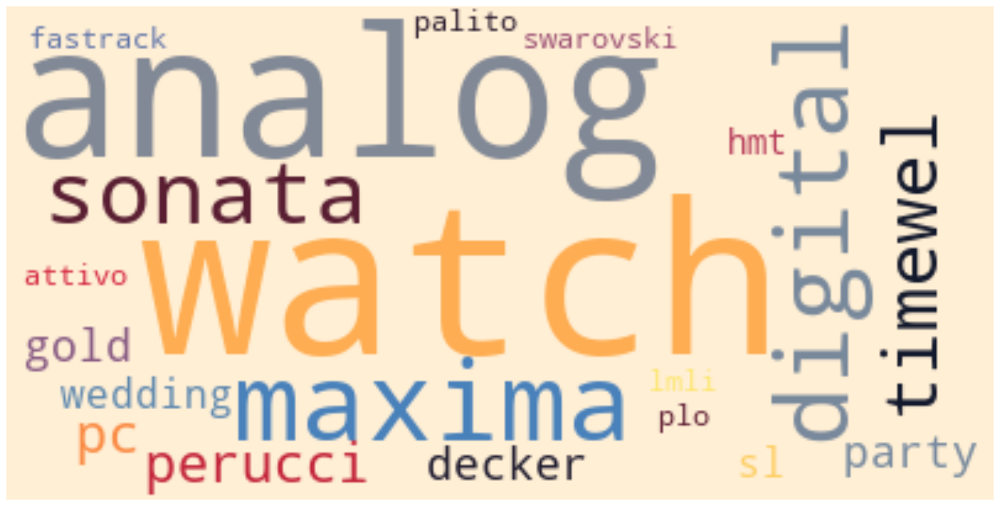

Mots les plus fréquents de la catégorie : Decor


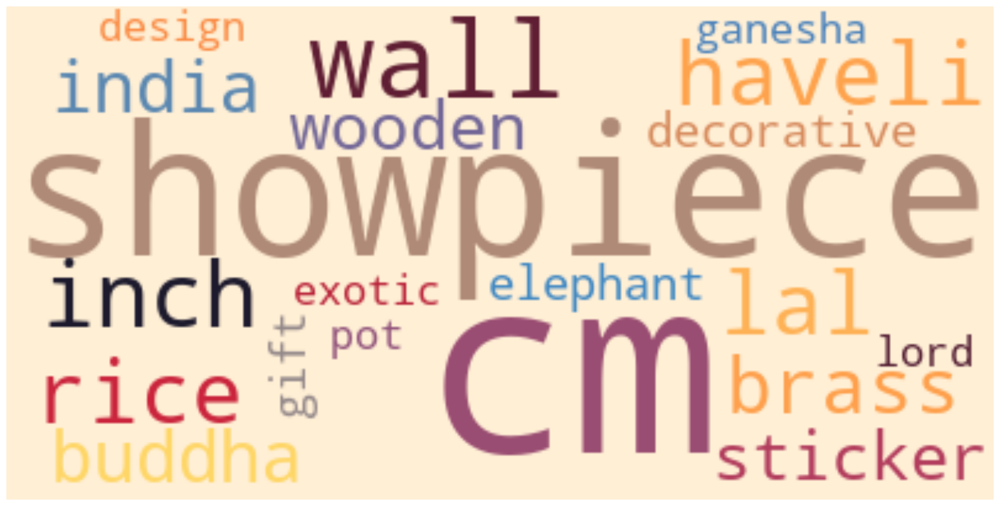

Mots les plus fréquents de la catégorie : Kitchen


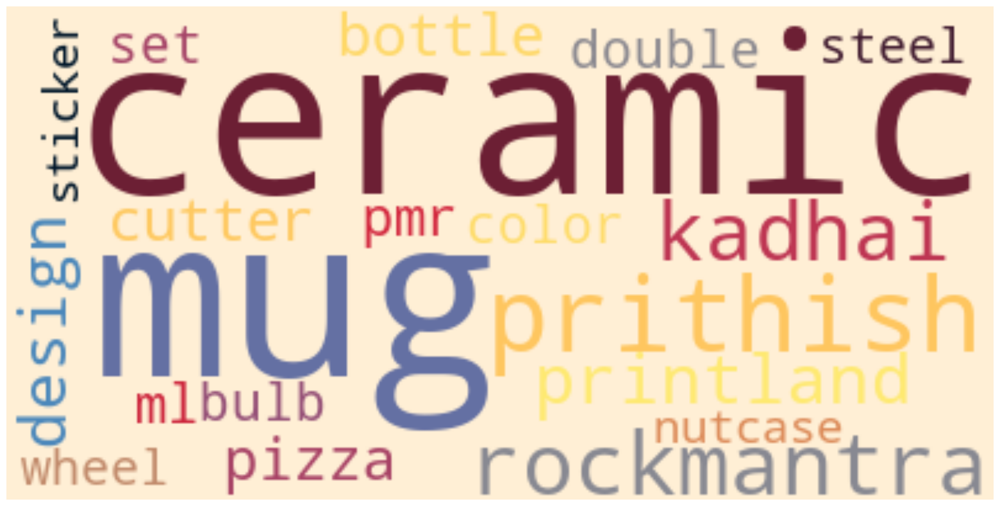

Mots les plus fréquents de la catégorie : Beauty


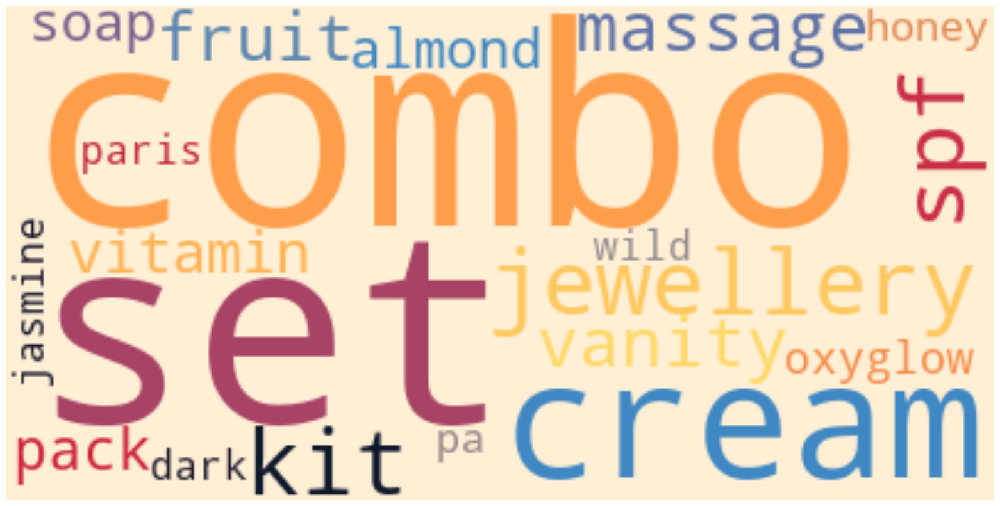

Mots les plus fréquents de la catégorie : Computers


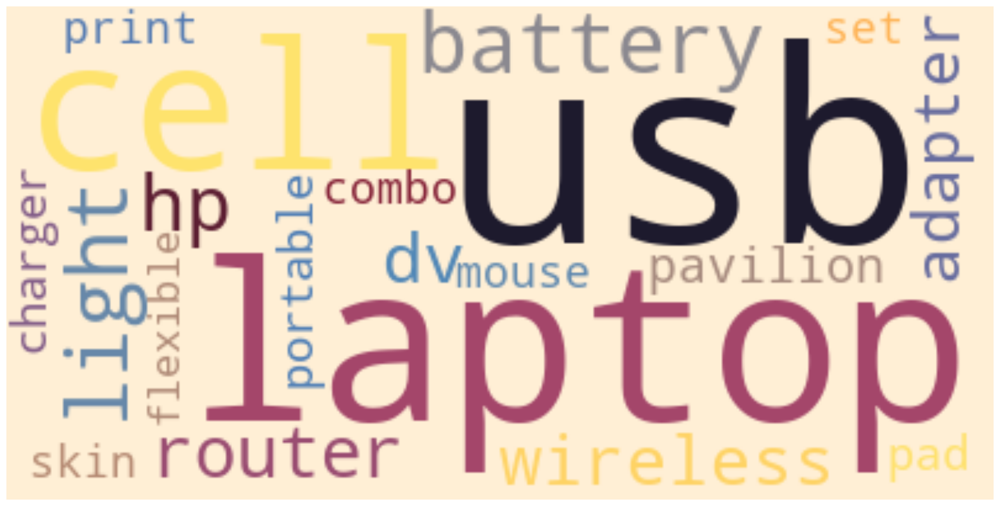

In [174]:
fonctions_data.affiche_wordcloud_hue(df_desc_cat, 'pname_clean',
                                  'category', 20)

**Fréquence des 50 mots les plus fréquents dans la description des produits**

In [175]:
# Préparation du dataframe de travail
# ---------------------------------------------------------------------
# Fréquence de tous les mots de tous les produits dans la description
# nettoyée ?
texte = ''
sentence = ' '.join([texte + row for row in df_desc_cat['desc_clean']])
tokens = nltk.word_tokenize(sentence)
fdist = FreqDist(tokens)
# Constitution du dataframe de travail
df_freq_clean = pd.DataFrame({'Mot': fdist.keys(),
                              'Frequence': fdist.values()}) \
                .sort_values(['Frequence'], ascending=False)
nb_tot = df_freq_clean['Frequence'].count()
df_freq_clean['%_frequence'] = \
    round((df_freq_clean['Frequence'])*100/nb_tot, 2)

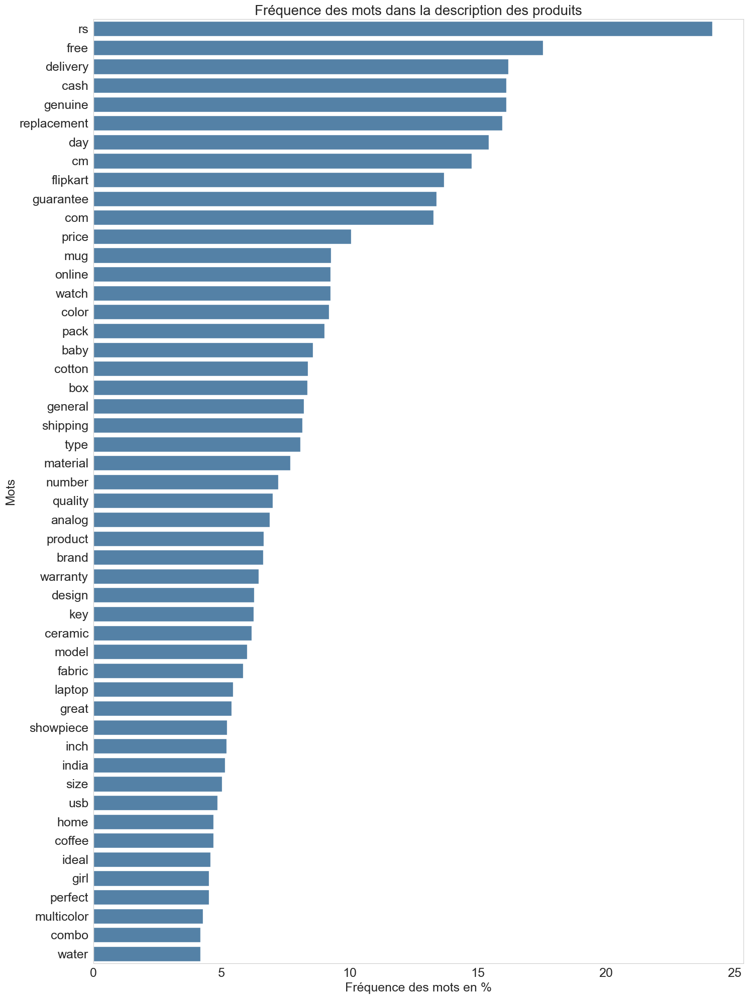

In [176]:
# Visualisation des 50 mots les plus fréquents dans description
# ---------------------------------------------------------------------
# Barplot de répartition
data_visu = df_freq_clean.head(50)
# Préparation de la liste des 50 mots les plus fréquents
liste_50_mots_desc = data_visu['Mot'].to_list()
sns.set_style("whitegrid")
plt.figure(figsize=(15, 20))
sns.barplot(x=data_visu['%_frequence'],
            y=data_visu['Mot'],
            data=data_visu,
            color='SteelBlue')
plt.title('Fréquence des mots dans la description des produits',
          fontsize=20)
plt.xlabel('Fréquence des mots en %', fontsize=18)
plt.ylabel('Mots', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(False)
plt.tight_layout()
plt.show()

## <span style='background:PowderBlue'>4. Feature extraction - Word & Text Embeddings</span>

### <span style='background:orange'>4.1 BOW - Bags of words - CountVectorizer</span>

***Note*** :
***
- CountVectorizer convertit une collection de documents texte en une matrice de comptage de tokens : les occurrences des tokens dans chaque document. 
- Cette implémentation produit une représentation éparse, creuse du nombre de tokens.

**Hyperparamètres** :
- **stop_words** : Étant donné que CountVectorizer ne compte que les occurrences de chaque mot de son vocabulaire, des mots extrêmement courants comme " le ", " et ", etc. deviendront des caractéristiques très importantes alors qu'ils ajoutent peu de sens au texte.
- **ngram_range** : Un n-gram est juste une chaîne de n mots à la suite. Par exemple, la phrase 'I am Groot' contient les 2-grammes 'I am' et 'am Groot'.
- **min_df**, **max_df** : Ce sont les fréquences minimales et maximales des documents que les mots/n-grammes doivent avoir pour être utilisés comme caractéristiques.
- **max_features** : Ce paramètre est assez explicite. Le CountVectorizer choisira les mots/caractéristiques qui apparaissent le plus fréquemment dans son vocabulaire et laissera tomber tout le reste.

In [33]:
title = 'TSNE_CV_ACP_DESC_LEM'

In [31]:
data_cat = data_work['category']

In [38]:
data_desc = data_work['description']
data_desc[24]

'fastrack 38015PL01 Analog Watch  - For Men, Boys - Buy fastrack 38015PL01 Analog Watch  - For Men, Boys  38015PL01 Online at Rs.2495 in India Only at Flipkart.com. Stainless steel back cover. Hybrid case construction for a sportier and more rugged look with increased shock resistance. High precision quartz analogue movement. - Great Discounts, Only Genuine Products, 30 Day Replacement Guarantee, Free Shipping. Cash On Delivery!'

**Traitement variable origine**

**description** - variable brut

In [39]:
data_desc_c = data_desc.copy()

df_desc_cv = fonctions_data.vectorize_text_data(data_desc_c, CountVectorizer())
df_desc_cv_acp = fonctions_data.acp(df_desc_cv)
df_desc_cv_acp_tsne = fonctions_data.tsne(df_desc_cv_acp, 40)
df_desc_cv_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_desc_cv_acp_tsne, data_cat)                            

(1050, 6053)
Nombre de features après réduction ACP pour 99.0% de variance : 614
-----------------------------------------
 ARI  : 0.3307
 Homogénéité  : 0.4221
-----------------------------------------


**description** - lemmatisée

In [29]:
data_desc_lem = data_work['desc_lem']
data_desc_lem[24]

'fastrack pl analog watch fastrack pl analog watch online rs india flipkart com stainless steel hybrid case construction rugged look increased shock resistance high precision quartz analogue movement great genuine day replacement guarantee free shipping cash delivery'

(1050, 3503)
Nombre de features après réduction ACP pour 99.0% de variance : 560
-----------------------------------------
 ARI  : 0.43
 Homogénéité  : 0.5399
-----------------------------------------


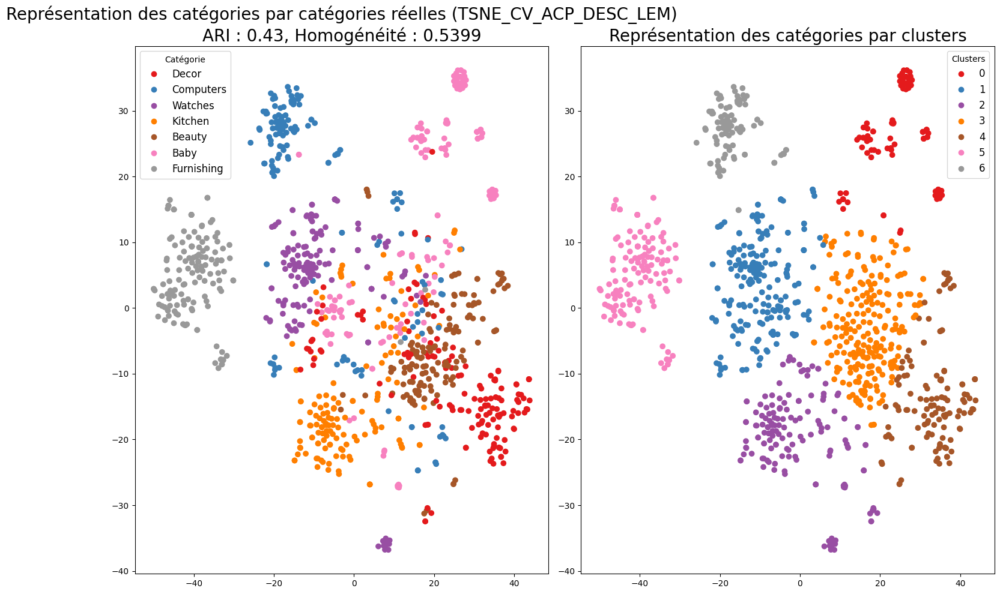

In [34]:
data_desc_lem_c = data_desc_lem.copy()

df_desc_lem_cv = fonctions_data.vectorize_text_data(data_desc_lem, CountVectorizer())
df_desc_lem_cv_acp = fonctions_data.acp(df_desc_lem_cv)
df_desc_lem_cv_acp_tsne = fonctions_data.tsne(df_desc_lem_cv_acp, 40)
df_desc_lem_cv_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_desc_lem_cv_acp_tsne, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_desc_lem_cv_acp_tsne_km, labels, ARI, Homogeneite, title)

- On constate deja la formation des groupes, avec un indicateur de similarité de 43 %, et un degré d'homogénéité de 54 %, la confirmation des résultats devra etre effectué via l'extraction des features. 

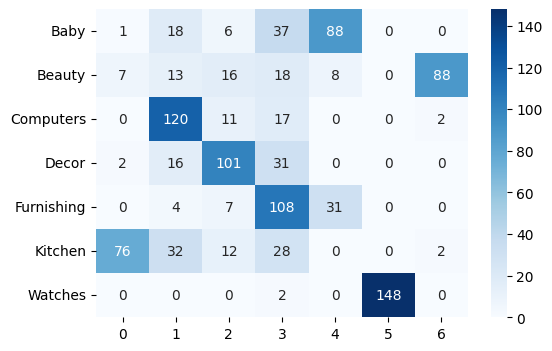

In [177]:
fonctions_data.conf_mat(df_desc_lem_cv_acp_tsne_km['label'], df_desc_lem_cv_acp_tsne_km['cluster_id'])

**nom_produit** - lemmatisée

In [224]:
title = 'TSNE_CV_ACP_PROD_LEM'

In [182]:
data_prod_lem = data_work['pname_lem']
data_prod_lem[24]

'fastrack pl analog watch'

(1050, 1617)
Nombre de features après réduction ACP pour 99.0% de variance : 748
-----------------------------------------
 ARI  : 0.3326
 Homogénéité  : 0.4524
-----------------------------------------


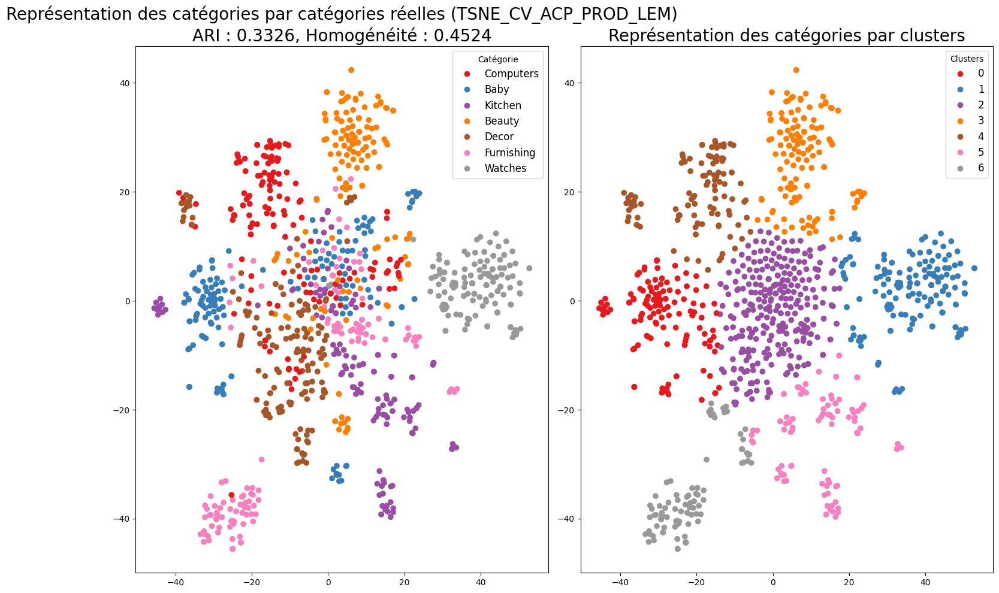

In [225]:
data_prod_lem_c = data_prod_lem.copy()

df_prod_lem_cv = fonctions_data.vectorize_text_data(data_prod_lem_c, CountVectorizer())
df_prod_lem_cv_acp = fonctions_data.acp(df_prod_lem_cv)
df_prod_lem_cv_acp_tsne = fonctions_data.tsne(df_prod_lem_cv_acp, 40)
df_prod_lem_cv_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_prod_lem_cv_acp_tsne, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_prod_lem_cv_acp_tsne_km, labels, ARI, Homogeneite, title)

- Le score ARI est assez faible (0.33), ainsi que le degré d'homogénéité (0.45)
- La combinaison CountVectorizer + ACP + nom du produit + lemmatisés, ne parvient pas à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (61%).

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.803571,0.600000,0.687023,150.000000
1,0.586466,0.520000,0.551237,150.000000
2,0.730000,0.486667,0.584000,150.000000
3,0.755396,0.700000,0.726644,150.000000
4,0.263889,0.506667,0.347032,150.000000
5,0.755102,0.493333,0.596774,150.000000
6,0.805556,0.966667,0.878788,150.000000
accuracy,0.610476,0.610476,0.610476,0.610476
macro avg,0.671426,0.610476,0.624500,1050.000000
weighted avg,0.671426,0.610476,0.624500,1050.000000


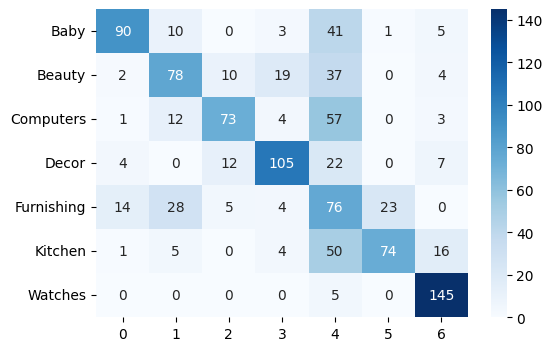

In [211]:
fonctions_data.conf_mat_metrics(df_prod_lem_cv_acp_tsne_km)

**specification_produit** - lemmatisée

In [69]:
title = 'TSNE_ACP_CV_PRODS_LEM'

In [70]:
data_prods_lem = data_work['prod_spec_lem']
data_prods_lem[2]

'product specification key material value cotton key design value shuvam key brand value key value key type value face towel key model name value shuvam key ideal value key model id value shuvam key size value small key color value key weight value key length value inch key width value inch key number package value key package value piece face towel set'

(1050, 2638)
Nombre de features après réduction ACP pour 99.0% de variance : 393
-----------------------------------------
 ARI  : 0.3138
 Homogénéité  : 0.4562
-----------------------------------------


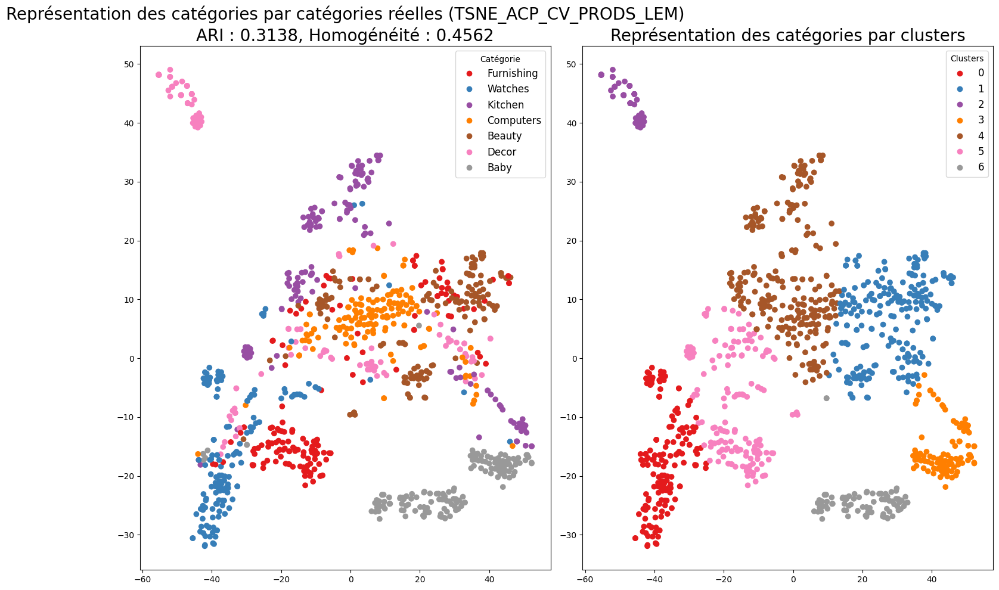

In [71]:
data_prods_lem_c = data_prods_lem.copy()

df_prods_lem_cv = fonctions_data.vectorize_text_data(data_prods_lem_c, CountVectorizer())
df_prods_lem_cv_acp = fonctions_data.acp(df_prods_lem_cv)
df_prods_lem_cv_acp_tsne = fonctions_data.tsne(df_prods_lem_cv_acp, 40)
df_prods_lem_cv_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_prods_lem_cv_acp_tsne, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_prods_lem_cv_acp_tsne_km, labels, ARI, Homogeneite, title)

- Le score ARI est assez faible (0.31), ainsi que le degré d'homogénéité (0.46)
- La combinaison CountVectorizer + ACP + specialisation_produit + lemmatisés, ne parvient pas à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (59%).

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.512500,0.546667,0.529032,150.000000
1,0.719512,0.786667,0.751592,150.000000
2,0.380392,0.646667,0.479012,150.000000
3,0.000000,0.000000,0.000000,150.000000
4,0.490991,0.726667,0.586022,150.000000
5,1.000000,0.486667,0.654709,150.000000
6,0.801136,0.940000,0.865031,150.000000
accuracy,0.590476,0.590476,0.590476,0.590476
macro avg,0.557790,0.590476,0.552200,1050.000000
weighted avg,0.557790,0.590476,0.552200,1050.000000


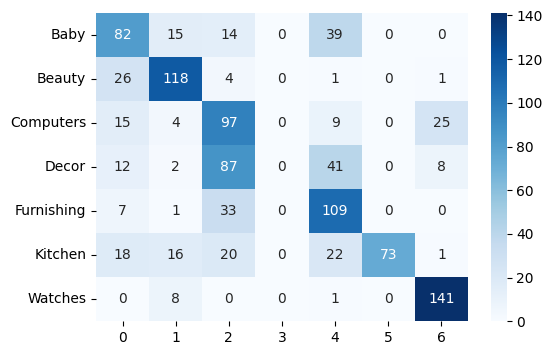

In [72]:
fonctions_data.conf_mat_metrics(df_prods_lem_cv_acp_tsne_km)

**description** - racinisée

In [231]:
data_desc_stem = data_work['desc_stem']
data_desc_stem[2]

'key eurospa cotton terri face towel size small height inch gsm eurospa cotton terri face towel piec face towel assort price rs eurospa soft cotton export qualiti soft textur care skin bath lot renown last famous fine absorb soft durabl product cotton suscept product color pictur size wash care wash cold water flat dri wash first use size face towel cms cms eurospa cotton terri face towel piec face towel bath towel materi cotton terri design shuvam general brand eurospa gsm type face towel model name ideal boy id shuvam size small color length inch inch box number packag packag piec face towel set'

In [233]:
data_desc_stem_c = data_desc_stem.copy()

df_desc_stem_cv = fonctions_data.vectorize_text_data(data_desc_stem_c, CountVectorizer())
df_desc_stem_cv_acp = fonctions_data.acp(df_desc_stem_cv)
df_desc_stem_cv_acp_tsne = fonctions_data.tsne(df_desc_stem_cv_acp, 40)
df_desc_stem_cv_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_desc_stem_cv_acp_tsne, data_cat)  

(1050, 3260)
Nombre de features après réduction ACP pour 99.0% de variance : 556
-----------------------------------------
 ARI  : 0.3879
 Homogénéité  : 0.5047
-----------------------------------------


**nom_produit** - racinisée

In [234]:
data_prod_stem = data_work['pname_stem']
data_prod_stem[2]

'eurospa cotton terri face towel set'

In [235]:
data_prod_stem_c = data_prod_stem.copy()

df_prod_stem_cv = fonctions_data.vectorize_text_data(data_prod_stem_c, CountVectorizer())
df_prod_stem_cv_acp = fonctions_data.acp(df_prod_stem_cv)
df_prod_stem_cv_acp_tsne = fonctions_data.tsne(df_prod_stem_cv_acp, 40)
df_prod_stem_cv_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_prod_stem_cv_acp_tsne, data_cat)  

(1050, 1595)
Nombre de features après réduction ACP pour 99.0% de variance : 746
-----------------------------------------
 ARI  : 0.3281
 Homogénéité  : 0.4325
-----------------------------------------


**specification_produit** - racinisée

In [58]:
title = 'TSNE_ACP_CV_PRODS_STEM'

In [59]:
data_prods_stem = data_work['prod_spec_stem']
data_prods_stem[2]

'product specif key materi valu cotton key design valu shuvam key brand valu key valu key type valu face towel key model name valu shuvam key ideal valu key model id valu shuvam key size valu small key color valu key weight valu key length valu inch key width valu inch key number packag valu key packag valu piec face towel set'

(1050, 2544)
Nombre de features après réduction ACP pour 99.0% de variance : 388
-----------------------------------------
 ARI  : 0.3086
 Homogénéité  : 0.4469
-----------------------------------------


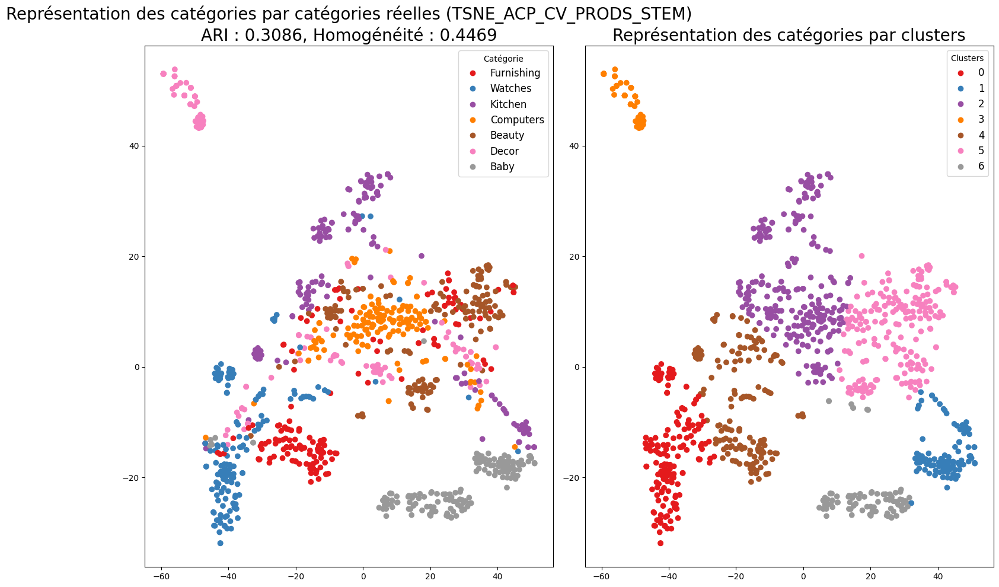

In [60]:
data_prods_stem_c = data_prods_stem.copy()

df_prods_stem_cv = fonctions_data.vectorize_text_data(data_prods_stem_c, CountVectorizer())
df_prods_stem_cv_acp = fonctions_data.acp(df_prods_stem_cv)
df_prods_stem_cv_acp_tsne = fonctions_data.tsne(df_prods_stem_cv_acp, 40)
df_prods_stem_cv_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_prods_stem_cv_acp_tsne, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_prods_stem_cv_acp_tsne_km, labels, ARI, Homogeneite, title)

,precision,recall,f1-score,support
0,0.506329,0.533333,0.519481,150.000000
1,0.714286,0.800000,0.754717,150.000000
2,0.373541,0.640000,0.471744,150.000000
3,0.000000,0.000000,0.000000,150.000000
4,0.485981,0.693333,0.571429,150.000000
5,1.000000,0.486667,0.654709,150.000000
6,0.783333,0.940000,0.854545,150.000000
accuracy,0.584762,0.584762,0.584762,0.584762
macro avg,0.551924,0.584762,0.546661,1050.000000
weighted avg,0.551924,0.584762,0.546661,1050.000000


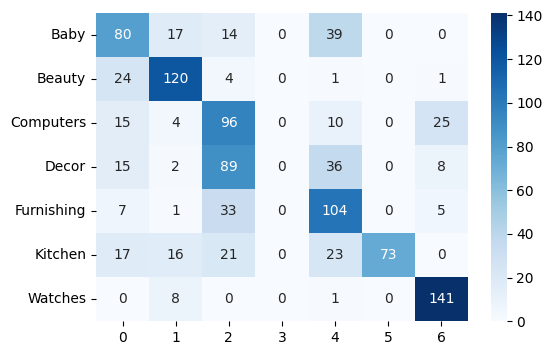

In [61]:
fonctions_data.conf_mat_metrics(df_prods_stem_cv_acp_tsne_km)

### <span style='background:orange'>4.2. BOW - TfidfVectorizer</span>

- Une transformation tf-idf (term frequency-inverse document frequency), permet de pondérer les fréquences d’apparition des termes par leur nombre d’occurrences dans l’ensemble des documents.
- La pondération tf-idf permet de contrebalancer l’importance d’un mot utilisé très fréquemment dans tous les documents du corpus par rapport aux termes plus spécifiques à certains documents. 
- TF-IDF est un produit de deux parties :
    - TF (Term Frequency) - Elle est définie comme le nombre de fois qu'un mot apparaît dans une phrase donnée.
    - IDF (Inverse Document Frequency) - Il est défini comme le logarithme à la base e du nombre total de documents divisé par les documents dans lesquels le mot apparaît.   

**description** - lemmatisée

In [268]:
title = 'TSNE_TFIDF_ACP_DESC_LEM'

(1050, 3503)
Nombre de features après réduction ACP pour 99.0% de variance : 789
-----------------------------------------
 ARI  : 0.468
 Homogénéité  : 0.5547
-----------------------------------------


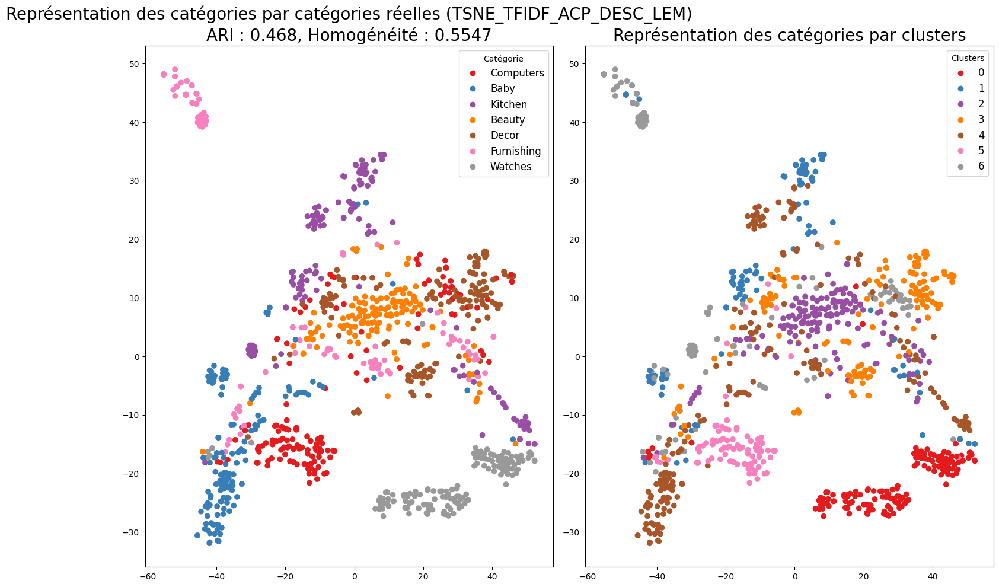

In [266]:
data_desc_lem_c = data_desc_lem.copy()

df_desc_lem_tf = fonctions_data.vectorize_text_data(data_desc_lem_c, TfidfVectorizer())
df_desc_lem_tf_acp = fonctions_data.acp(df_desc_lem_tf)
df_desc_lem_tf_acp_tsne = fonctions_data.tsne(df_desc_lem_tf_acp, 40)
df_desc_lem_tf_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_desc_lem_tf_acp_tsne, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_prods_lem_cv_acp_tsne_km, labels, ARI, Homogeneite, title)

- Le score ARI est moyen (0.47), ainsi que le degré d'homogénéité (0.55)
- La combinaison TfIdfVectorizer + ACP + description + lemmatisés, ne parvient pas à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (69,4%).

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.957447,0.600000,0.737705,150.000000
1,0.391705,0.566667,0.463215,150.000000
2,0.685484,0.566667,0.620438,150.000000
3,0.773006,0.840000,0.805112,150.000000
4,0.768750,0.820000,0.793548,150.000000
5,0.503546,0.473333,0.487973,150.000000
6,0.986755,0.993333,0.990033,150.000000
accuracy,0.694286,0.694286,0.694286,0.694286
macro avg,0.723813,0.694286,0.699718,1050.000000
weighted avg,0.723813,0.694286,0.699718,1050.000000


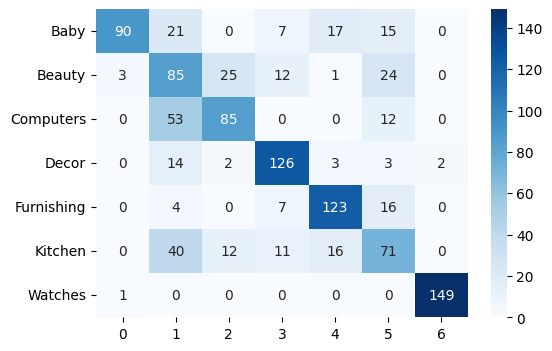

In [254]:
fonctions_data.conf_mat_metrics(df_desc_lem_tf_acp_tsne_km)

**nom_produit** - lemmatisée

In [247]:
data_prod_lem_c = data_prod_lem.copy()

df_prod_lem_tf = fonctions_data.vectorize_text_data(data_prod_lem_c, TfidfVectorizer())
df_prod_lem_tf_acp = fonctions_data.acp(df_prod_lem_tf)
df_prod_lem_tf_acp_tsne = fonctions_data.tsne(df_prod_lem_tf_acp, 40)
df_prod_lem_tf_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_prod_lem_tf_acp_tsne, data_cat)  

(1050, 1617)
Nombre de features après réduction ACP pour 99.0% de variance : 785
-----------------------------------------
 ARI  : 0.4073
 Homogénéité  : 0.4765
-----------------------------------------


**specification_produit** - lemmatisée

(1050, 2638)
Nombre de features après réduction ACP pour 99.0% de variance : 736
-----------------------------------------
 ARI  : 0.4685
 Homogénéité  : 0.5743
-----------------------------------------


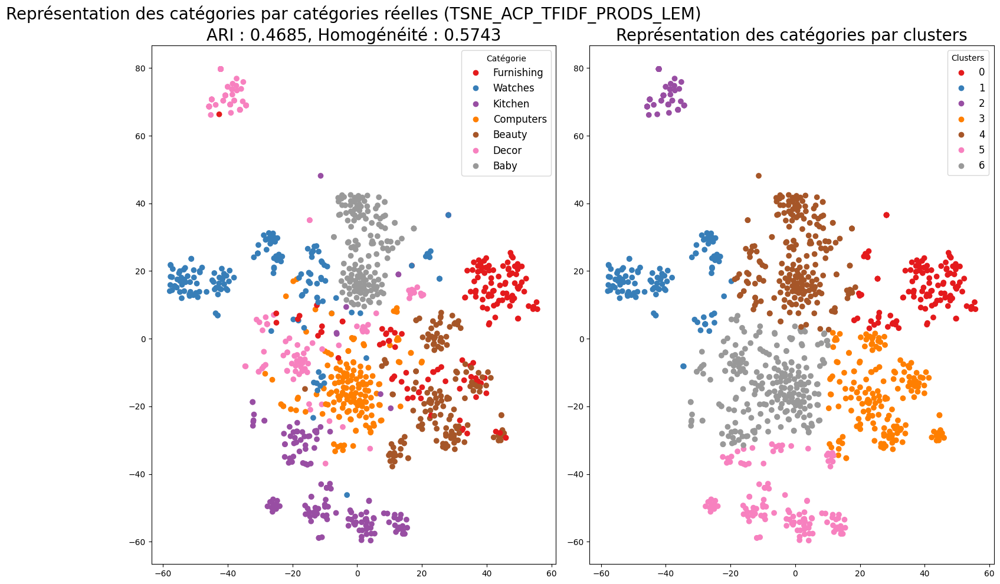

In [79]:
title = 'TSNE_ACP_TFIDF_PRODS_LEM'
data_prods_lem_c = data_prods_lem.copy()

df_prods_lem_tf = fonctions_data.vectorize_text_data(data_prods_lem_c, TfidfVectorizer())
df_prods_lem_tf_acp = fonctions_data.acp(df_prods_lem_tf)
df_prods_lem_tf_acp_tsne = fonctions_data.tsne(df_prods_lem_tf_acp, 40)
df_prods_lem_tf_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_prods_lem_tf_acp_tsne, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_prods_lem_tf_acp_tsne_km, labels, ARI, Homogeneite, title)

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.726496,0.566667,0.636704,150.00000
1,0.845455,0.620000,0.715385,150.00000
2,0.849206,0.713333,0.775362,150.00000
3,0.525424,0.826667,0.642487,150.00000
4,0.687861,0.793333,0.736842,150.00000
5,0.986667,0.493333,0.657778,150.00000
6,0.704225,1.000000,0.826446,150.00000
accuracy,0.716190,0.716190,0.716190,0.71619
macro avg,0.760762,0.716190,0.713001,1050.00000
weighted avg,0.760762,0.716190,0.713001,1050.00000


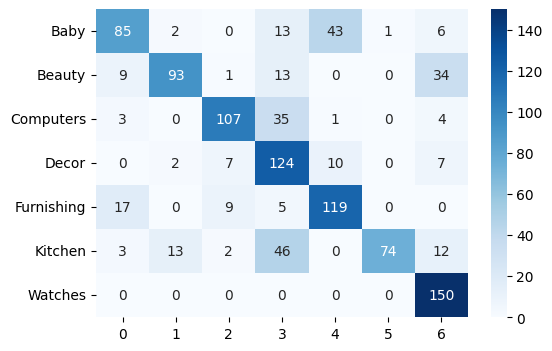

In [80]:
fonctions_data.conf_mat_metrics(df_prods_lem_tf_acp_tsne_km)

**description** - racinisée

In [249]:
data_desc_stem_c = data_desc_stem.copy()

df_desc_stem_tf = fonctions_data.vectorize_text_data(data_desc_stem_c, TfidfVectorizer())
df_desc_stem_tf_acp = fonctions_data.acp(df_desc_stem_tf)
df_desc_stem_tf_acp_tsne = fonctions_data.tsne(df_desc_stem_tf_acp, 40)
df_desc_stem_tf_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_desc_stem_tf_acp_tsne, data_cat)  

(1050, 3260)
Nombre de features après réduction ACP pour 99.0% de variance : 786
-----------------------------------------
 ARI  : 0.4367
 Homogénéité  : 0.5235
-----------------------------------------


**nom_produit** - racinisée

In [250]:
data_prod_stem_c = data_prod_stem.copy()

df_prod_stem_tf = fonctions_data.vectorize_text_data(data_prod_stem_c, TfidfVectorizer())
df_prod_stem_tf_acp = fonctions_data.acp(df_prod_stem_tf)
df_prod_stem_tf_acp_tsne = fonctions_data.tsne(df_prod_stem_tf_acp, 40)
df_prod_stem_tf_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_prod_stem_tf_acp_tsne, data_cat)  

(1050, 1595)
Nombre de features après réduction ACP pour 99.0% de variance : 783
-----------------------------------------
 ARI  : 0.3824
 Homogénéité  : 0.4639
-----------------------------------------


**specification_produit** - racicnisée

(1050, 2544)
-----------------------------------------
 ARI  : 0.4452
 Homogénéité  : 0.5517
-----------------------------------------


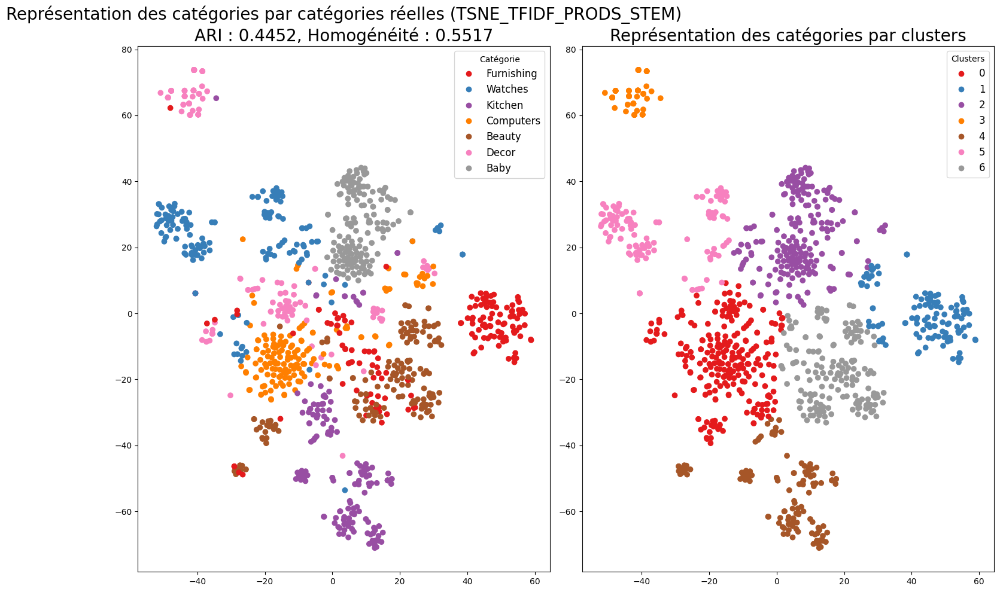

In [85]:
title = 'TSNE_TFIDF_PRODS_STEM'
data_prods_stem_c = data_prods_stem.copy()

df_prods_stem_tf = fonctions_data.vectorize_text_data(data_prods_stem_c, TfidfVectorizer())
df_prods_stem_tf_acp_tsne = fonctions_data.tsne(df_prods_stem_tf, 40)
df_prods_stem_tf_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_prods_stem_tf_acp_tsne, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_prods_stem_tf_acp_tsne_km, labels, ARI, Homogeneite, title)

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.648855,0.566667,0.604982,150.000000
1,0.954545,0.700000,0.807692,150.000000
2,0.989474,0.626667,0.767347,150.000000
3,0.439655,0.680000,0.534031,150.000000
4,0.668317,0.900000,0.767045,150.000000
5,0.973684,0.493333,0.654867,150.000000
6,0.735294,1.000000,0.847458,150.000000
accuracy,0.709524,0.709524,0.709524,0.709524
macro avg,0.772832,0.709524,0.711918,1050.000000
weighted avg,0.772832,0.709524,0.711918,1050.000000


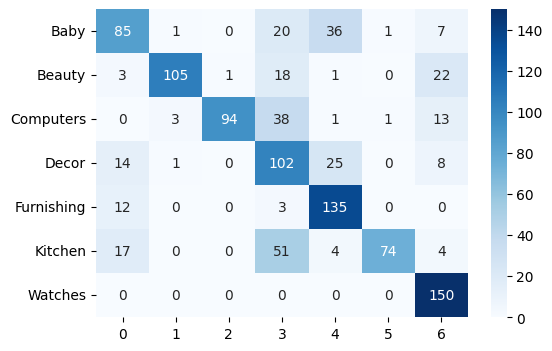

In [83]:
fonctions_data.conf_mat_metrics(df_prods_stem_tf_acp_tsne_km)

#### tfidf : nettoyage supplémentaire avec seuil de fréquence des mots

In [568]:
data_desc_lem_c = data_desc_lem.copy()

df_desc_lem_tf_freq = fonctions_data.vectorize_text_data(data_desc_lem_c, TfidfVectorizer(max_df=0.75, min_df=0.005))
df_desc_lem_tf_acp_freq = fonctions_data.acp(df_desc_lem_tf_freq)
df_desc_lem_tf_acp_tsne_freq = fonctions_data.tsne(df_desc_lem_tf_acp_freq, 20)
df_desc_lem_tf_acp_tsne_km_freq, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_desc_lem_tf_acp_tsne_freq, data_cat)  

(1050, 603)
Nombre de features après réduction ACP pour 99.0% de variance : 379
-----------------------------------------
 ARI  : 0.4805
 Homogénéité  : 0.5836
-----------------------------------------


(1050, 603)
-----------------------------------------
 ARI  : 0.5267
 Homogénéité  : 0.6165
-----------------------------------------


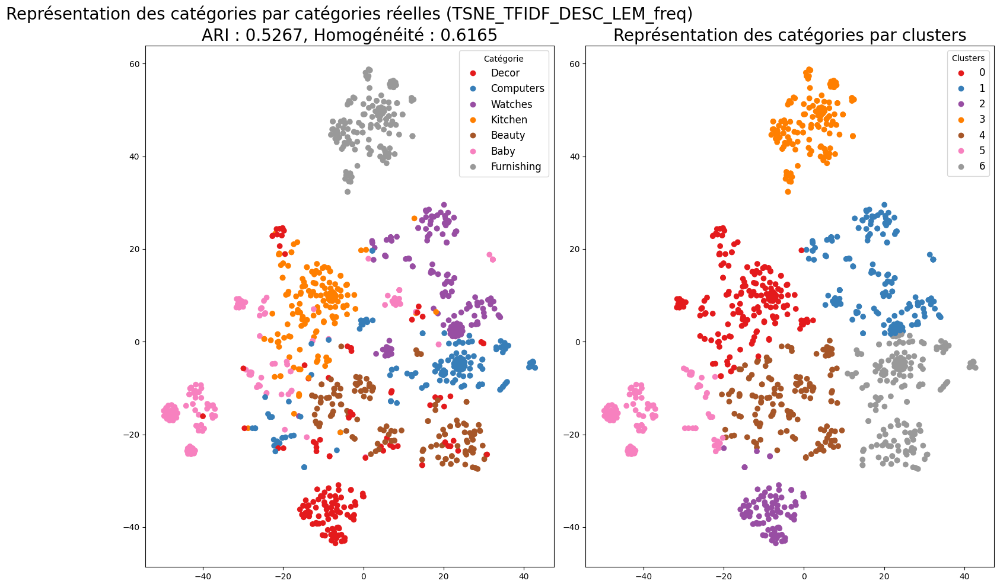

In [35]:
# Sans ACP
title = 'TSNE_TFIDF_DESC_LEM_freq'
df_desc_lem_tf_freq = fonctions_data.vectorize_text_data(data_desc_lem_c, TfidfVectorizer(max_df=0.75, min_df=0.005))
df_desc_lem_tf_tsne_freq = fonctions_data.tsne(df_desc_lem_tf_freq, 40)
df_desc_lem_tf_tsne_km_freq, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_desc_lem_tf_tsne_freq, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_desc_lem_tf_tsne_km_freq, labels, ARI, Homogeneite, title)
df_desc_lem_tf_tsne_freq.to_csv('df_desc_lem_tf_tsne_freq.csv', index=False)

- Le score ARI assez bon (0.53), ainsi que le degré d'homogénéité (0.62)
- La combinaison TfIdfVectorizer + description + lemmatisés + freq de mots, ne parvient pas exactement à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (72,3%).

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.967742,0.600000,0.740741,150.000000
1,0.512953,0.660000,0.577259,150.000000
2,0.767442,0.880000,0.819876,150.000000
3,0.723164,0.853333,0.782875,150.000000
4,0.496815,0.520000,0.508143,150.000000
5,0.796296,0.573333,0.666667,150.000000
6,1.000000,1.000000,1.000000,150.000000
accuracy,0.726667,0.726667,0.726667,0.726667
macro avg,0.752059,0.726667,0.727937,1050.000000
weighted avg,0.752059,0.726667,0.727937,1050.000000


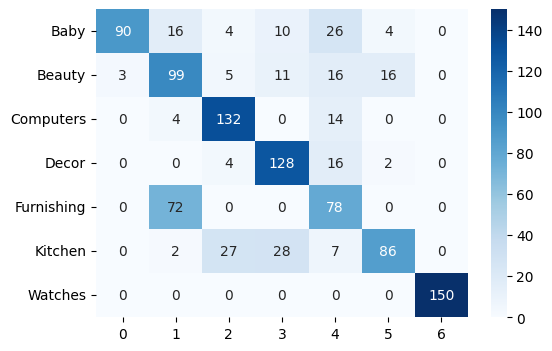

In [270]:
fonctions_data.conf_mat_metrics(df_desc_lem_tf_tsne_km_freq)

### <span style='background:orange'>4.3. Word2vec</span>

**nom_produit** - brut

In [ ]:
text_dim = 300

In [214]:
# Description Lemmatisée word2vec a besoin d'une liste de liste
data_vec = data_work['product_name']
data_work['product_name_token'] = \
    [word_tokenize(str(row)) for row in
     data_vec]
data_token = data_work['product_name_token'].copy()

In [215]:
# Instanciation du modèle
w2v_model_pname = Word2Vec(data_token, vector_size=300, window=5, min_count=1, workers=4)
# Construit le vocabulaire à partir d'une séquence de mots et
# initialise ainsi le modèle.
w2v_model_pname.build_vocab(data_token,
                               progress_per=10000)
# Entraînement du modèle
w2v_model_pname.train(data_token,
                         total_examples=w2v_model_pname.corpus_count,
                         epochs=30, report_delay=1)

(194529, 237870)

In [216]:
# Vectorisation
vector_w2v_pname = fonctions_data.word2vec_vectorisation(data_vec,
                                                        text_dim,
                                                        w2v_model_pname)
# Dataframe pour réduction de dimension
df_w2v_pname = pd.DataFrame(vector_w2v_pname)

Nombre de features après réduction ACP pour 99.0% de variance : 6
-----------------------------------------
 ARI  : 0.6344
 Homogénéité  : 0.7403
-----------------------------------------


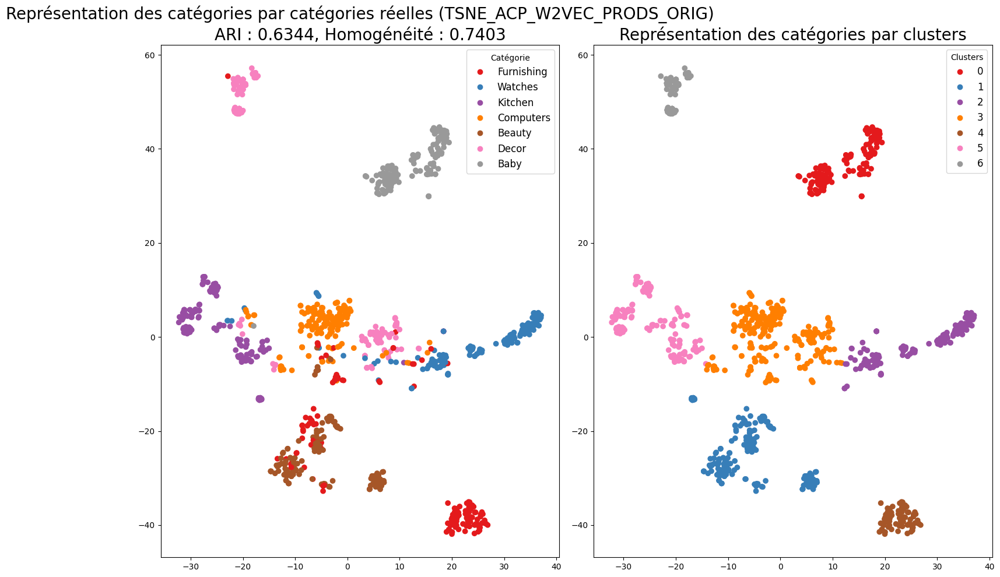

In [217]:
title = 'TSNE_ACP_W2VEC_PRODS_ORIG'
df_w2v_pname_acp = fonctions_data.acp(df_w2v_pname)
df_w2v_pname_acp_tsne = fonctions_data.tsne(df_w2v_prods_lem_acp, 40)
df_w2v_pname_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_w2v_pname_acp_tsne, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_w2v_pname_acp_tsne_km, labels, ARI, Homogeneite, title)

- Le score ARI est bon (0.63), ainsi que le degré d'homogénéité (0.74)
- La combinaison Word2Vec + TfIdfVectorizer + ACP + nom_produit , parvient pas à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (81%).

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,1.000000,0.553333,0.712446,150.000000
1,0.910345,0.880000,0.894915,150.000000
2,0.865385,0.900000,0.882353,150.000000
3,0.553785,0.926667,0.693267,150.000000
4,0.738220,0.940000,0.826979,150.000000
5,0.986667,0.493333,0.657778,150.000000
6,1.000000,0.993333,0.996656,150.000000
accuracy,0.812381,0.812381,0.812381,0.812381
macro avg,0.864914,0.812381,0.809199,1050.000000
weighted avg,0.864914,0.812381,0.809199,1050.000000


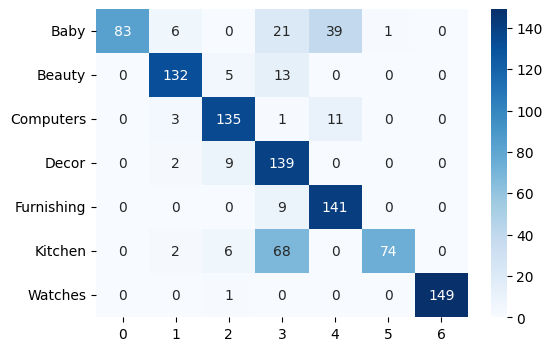

In [218]:
fonctions_data.conf_mat_metrics(df_w2v_pname_acp_tsne_km)

**produit_specifications** - lemmatisée

In [106]:
# Description Lemmatisée word2vec a besoin d'une liste de liste
data_vec = data_work['prod_spec_lem']
data_work['prod_spec_lem_token'] = \
    [word_tokenize(str(row)) for row in
     data_vec]
data_token = data_work['prod_spec_lem_token'].copy()

In [107]:
# Instanciation du modèle
w2v_model_prods_lem = Word2Vec(data_token, vector_size=300, window=5, min_count=1, workers=4)
# Construit le vocabulaire à partir d'une séquence de mots et
# initialise ainsi le modèle.
w2v_model_prods_lem.build_vocab(data_token,
                               progress_per=10000)
# Entraînement du modèle
w2v_model_prods_lem.train(data_token,
                         total_examples=w2v_model_prods_lem.corpus_count,
                         epochs=30, report_delay=1)

(852543, 1800000)

In [108]:
# Vectorisation
vector_w2v_prods_lem = wofonctions_data.rd2vec_vectorisation(data_vec,
                                                        text_dim,
                                                        w2v_model_prods_lem)
# Dataframe pour réduction de dimension
df_w2v_prods_lem = pd.DataFrame(vector_w2v_prods_lem)

Nombre de features après réduction ACP pour 99.0% de variance : 17
-----------------------------------------
 ARI  : 0.5179
 Homogénéité  : 0.6312
-----------------------------------------


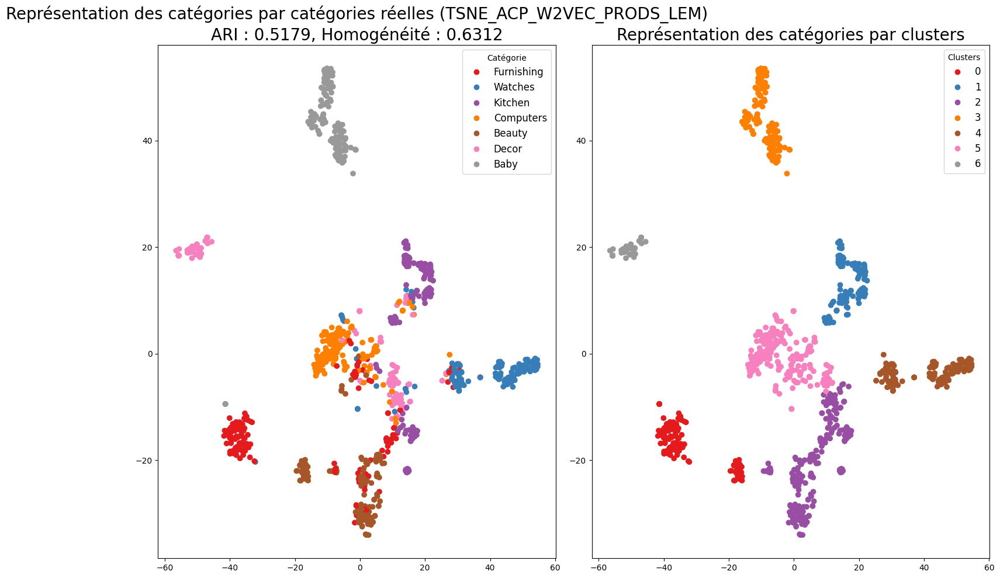

In [109]:
title = 'TSNE_ACP_W2VEC_PRODS_LEM'
df_w2v_prods_lem_acp = fonctions_data.acp(df_w2v_prods_lem)
df_w2v_prods_lem_acp_tsne = fonctions_data.tsne(df_w2v_prods_lem_acp, 40)
df_w2v_prods_lem_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_w2v_prods_lem_acp_tsne, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_w2v_prods_lem_acp_tsne_km, labels, ARI, Homogeneite, title)

- Le score ARI est assez bon (0.52), ainsi que le degré d'homogénéité (0.663)
- La combinaison Word2Vec + TfIdfVectorizer + ACP + description + lemmatisés , ne parvient pas exactement à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (74%).

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.674603,0.566667,0.615942,150.00
1,0.908451,0.860000,0.883562,150.00
2,0.851240,0.686667,0.760148,150.00
3,0.618182,0.906667,0.735135,150.00
4,0.472973,0.700000,0.564516,150.00
5,1.000000,0.493333,0.660714,150.00
6,1.000000,0.966667,0.983051,150.00
accuracy,0.740000,0.740000,0.740000,0.74
macro avg,0.789350,0.740000,0.743295,1050.00
weighted avg,0.789350,0.740000,0.743295,1050.00


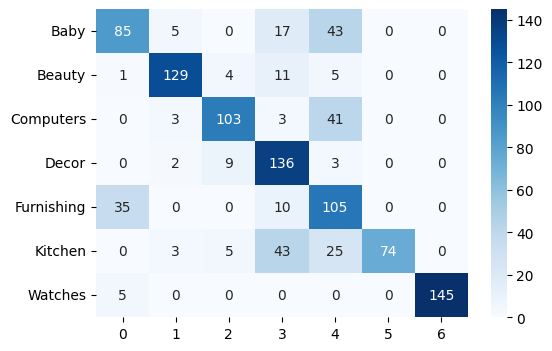

In [110]:
fonctions_data.conf_mat_metrics(df_w2v_prods_lem_acp_tsne_km)

**Word2Vec avec Skip gram**

In [111]:
# Instanciation du modèle
w2v_model_prods_lem = Word2Vec(data_token, vector_size=300, window=5, min_count=1, workers=4, sg = 1)
# Construit le vocabulaire à partir d'une séquence de mots et
# initialise ainsi le modèle.
w2v_model_prods_lem.build_vocab(data_token,
                               progress_per=10000)
# Entraînement du modèle
w2v_model_prods_lem.train(data_token,
                         total_examples=w2v_model_prods_lem.corpus_count,
                         epochs=30, report_delay=1)

(851997, 1800000)

In [113]:
# Vectorisation
vector_w2v_prods_lem = fonctions_data.word2vec_vectorisation(data_vec,
                                                        text_dim,
                                                        w2v_model_prods_lem)
# Dataframe pour réduction de dimension
df_w2v_prods_lem = pd.DataFrame(vector_w2v_prods_lem)

In [114]:
df_w2v_prods_lem_acp = fonctions_data.acp(df_w2v_prods_lem)
df_w2v_prods_lem_acp_tsne = fonctions_data.tsne(df_w2v_prods_lem_acp, 40)
df_w2v_prods_lem_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_w2v_prods_lem_acp_tsne, data_cat)  

Nombre de features après réduction ACP pour 99.0% de variance : 40
-----------------------------------------
 ARI  : 0.6344
 Homogénéité  : 0.7403
-----------------------------------------


**produit_specifications** - racinisée

In [115]:
# Description Lemmatisée word2vec a besoin d'une liste de liste
data_vec = data_work['prod_spec_stem']
data_work['prod_spec_stem_token'] = \
    [word_tokenize(str(row)) for row in
     data_vec]
data_token = data_work['prod_spec_stem_token'].copy()

In [116]:
# Instanciation du modèle
w2v_model_prods_stem = Word2Vec(data_token, vector_size=300, window=5, min_count=1, workers=4)
# Construit le vocabulaire à partir d'une séquence de mots et
# initialise ainsi le modèle.
w2v_model_prods_stem.build_vocab(data_token,
                               progress_per=10000)
# Entraînement du modèle
w2v_model_prods_stem.train(data_token,
                         total_examples=w2v_model_prods_stem.corpus_count,
                         epochs=30, report_delay=1)

(849272, 1799700)

In [117]:
# Vectorisation
vector_w2v_prods_stem = fonctions_data.word2vec_vectorisation(data_vec,
                                                        text_dim,
                                                        w2v_model_prods_lem)
# Dataframe pour réduction de dimension
df_w2v_prods_stem = pd.DataFrame(vector_w2v_prods_stem)

Nombre de features après réduction ACP pour 99.0% de variance : 43
-----------------------------------------
 ARI  : 0.6121
 Homogénéité  : 0.7163
-----------------------------------------


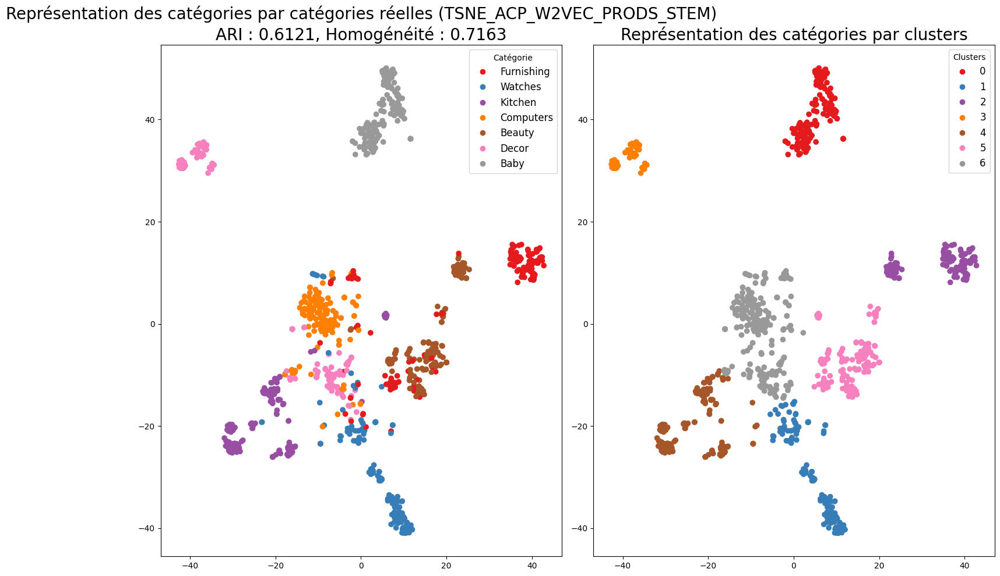

In [118]:
title = 'TSNE_ACP_W2VEC_PRODS_STEM'
df_w2v_prods_stem_acp = fonctions_data.acp(df_w2v_prods_stem)
df_w2v_prods_stem_acp_tsne = fonctions_data.tsne(df_w2v_prods_stem_acp, 40)
df_w2v_prods_stem_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_w2v_prods_stem_acp_tsne, data_cat)  
fonctions_data.affiche_projection_par_clusters(df_w2v_prods_stem_acp_tsne_km, labels, ARI, Homogeneite, title)

- Le score ARI est assez bon (0.61), ainsi que le degré d'homogénéité (0.716)
- La combinaison Word2Vec + TfIdfVectorizer + ACP + description + lemmatisés , ne parvient pas exactement à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (79%).

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.705882,0.560000,0.624535,150.000000
1,0.897260,0.873333,0.885135,150.000000
2,0.894737,0.906667,0.900662,150.000000
3,0.578947,0.953333,0.720403,150.000000
4,0.685185,0.740000,0.711538,150.000000
5,1.000000,0.493333,0.660714,150.000000
6,1.000000,1.000000,1.000000,150.000000
accuracy,0.789524,0.789524,0.789524,0.789524
macro avg,0.823145,0.789524,0.786141,1050.000000
weighted avg,0.823145,0.789524,0.786141,1050.000000


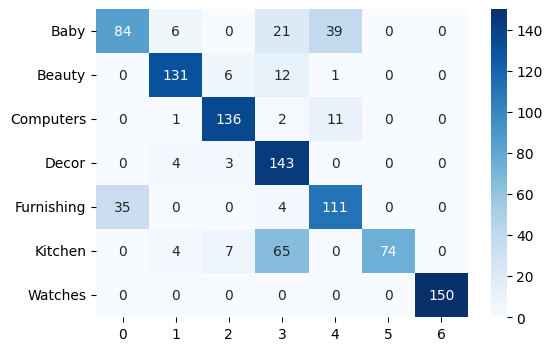

In [119]:
fonctions_data.conf_mat_metrics(df_w2v_prods_stem_acp_tsne_km)

**Word2Vec avec Skip gram**

In [120]:
# Instanciation du modèle
w2v_model_prods_stem = Word2Vec(data_token, vector_size=300, window=5, min_count=1, workers=4, sg = 1)
# Construit le vocabulaire à partir d'une séquence de mots et
# initialise ainsi le modèle.
w2v_model_prods_stem.build_vocab(data_token,
                               progress_per=10000)
# Entraînement du modèle
w2v_model_prods_stem.train(data_token,
                         total_examples=w2v_model_prods_stem.corpus_count,
                         epochs=30, report_delay=1)

(849954, 1799700)

In [121]:
# Vectorisation
vector_w2v_prods_stem =fonctions_data.word2vec_vectorisation(data_vec,
                                                        text_dim,
                                                        w2v_model_prods_stem)
# Dataframe pour réduction de dimension
df_w2v_prods_stem = pd.DataFrame(vector_w2v_prods_stem)

In [122]:
df_w2v_prods_stem_acp = fonctions_data.acp(df_w2v_prods_stem)
df_w2v_prods_stem_acp_tsne = fonctions_data.tsne(df_w2v_prods_stem_acp, 40)
df_w2v_prods_stem_acp_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_w2v_prods_stem_acp_tsne, data_cat)  

Nombre de features après réduction ACP pour 99.0% de variance : 40
-----------------------------------------
 ARI  : 0.6071
 Homogénéité  : 0.7197
-----------------------------------------


### <span style='background:orange'>4.4. BERT</span>


BERT de Google et les méthodes récentes basées sur les transformateurs ont pris d'assaut le paysage de la PNL, en surpassant l'état de l'art dans plusieurs tâches.

BERT est un transformateur bidirectionnel utilisé pour le pré-entraînement sur un grand nombre de données textuelles non étiquetées afin d'apprendre une représentation du langage pouvant être utilisée pour affiner les tâches d'apprentissage automatique spécifiques. Bien que BERT ait surpassé l'état de l'art du traitement automatique des langues dans plusieurs tâches difficiles, l'amélioration de ses performances peut être attribuée au transformateur bidirectionnel, aux nouvelles tâches de préformation du modèle de langage masqué et de la prédiction de la structure suivante, ainsi qu'à un grand nombre de données et à la puissance de calcul de Googrithme

L'algorithme fonctionne en 2 étapes :

1. **Pré-entraînement**
   Durant cette phase, le modèle a été formé de manière non supervisée, sans données labellisées, sur deux tâches spécifiques :
   - *Masked Language Modeling* (MLM) : modélisation du langage masqué, où le modèle doit prédire des mots intentionnellement masqués dans une phrase en se basant sur le contexte fourni par les autres mots de la phrase.
   - *Next Sentence Prediction* (NSP) : prédiction de la phrase suivante. L'objectif est de faire prédire au modèle la séquence de mots suivante pour comprendre la continuité entre des phrases consécutives.

2. **Fine-Tuning**
   Après la phase de pré-entraînement, BERT est fine-tuné sur des tâches spécifiques. Des couches supplémentaires sont ajoutées et entraînées sur des  (partie supervisée)données annotées, ce qui permet à BERT de s'adapter aux exigences de tâches particulières.


**nom_produit** - brut

In [208]:
# Variable dont on veut extraire les features
data_work['product_name'] = \
    data_work['product_name'].fillna('').astype(str)
df_pname = data_work['product_name']

**Modélisation**

In [209]:
# Instanciation du modèle
bert_pname = SentenceTransformer('roberta-large')
# Encodage
vector_roberta_pname = \
    bert_pname.encode(df_pname, show_progress_bar=False)

Some weights of RobertaModel were not initialized from the model checkpoint at C:\Users\yanni/.cache\torch\sentence_transformers\roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [210]:
vector_roberta_pname

array([[ 0.02632075, -0.01798778, -0.41005176, ..., -0.02043196,
         0.06263011,  0.10622946],
       [-0.02048348, -0.02765791, -0.33608183, ...,  0.08561511,
         0.08903083,  0.0429517 ],
       [ 0.01000335, -0.02403259, -0.39179373, ...,  0.04039324,
         0.14689721,  0.03684083],
       ...,
       [ 0.19458081, -0.06444005, -0.31950793, ...,  0.08140856,
         0.05041226,  0.06334802],
       [ 0.12979262, -0.06283251, -0.3203022 , ..., -0.0780363 ,
         0.09259146,  0.11677026],
       [ 0.10915783, -0.03143369, -0.2482375 , ...,  0.0237981 ,
         0.07390513,  0.04089151]], dtype=float32)

In [211]:
# Dataframe pour réduction de dimension
df_vector_bert_pname = pd.DataFrame(vector_roberta_pname)

df_vector_bert_pname_acp = fonctions_data.acp(df_vector_bert_pname)
tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_bert_tf_pname = tsne_red.fit_transform(df_vector_bert_pname_acp)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_bert_tf_pname.shape[1]+1, 1)]
df_bert_pname_tf_tsne = pd.DataFrame(X_tsne_bert_tf_pname, index=data_work.index, columns=columns)

Nombre de features après réduction ACP pour 99.0% de variance : 463


-----------------------------------------
 ARI  : 0.5242
 Homogénéité  : 0.5993
-----------------------------------------


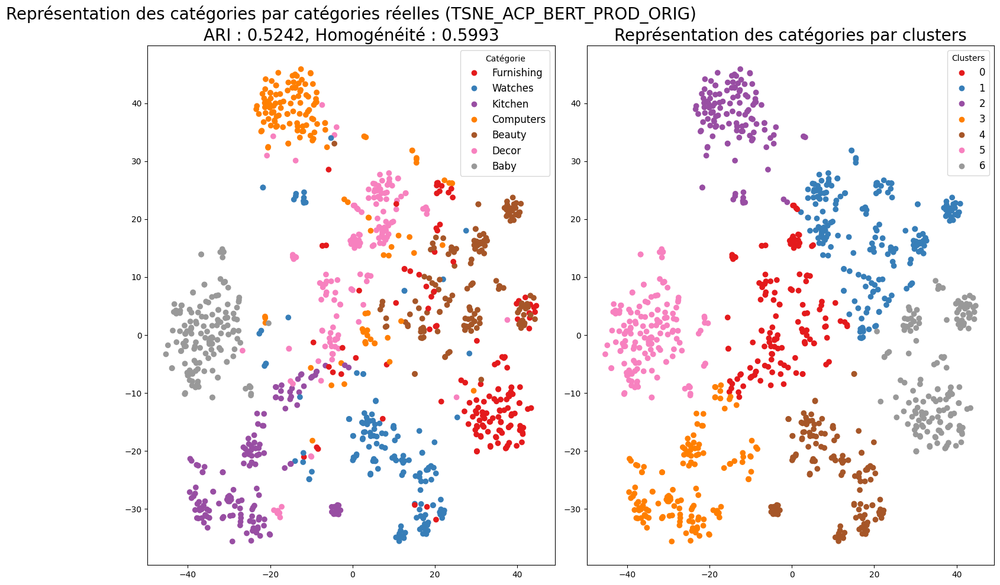

In [212]:
title = 'TSNE_ACP_BERT_PROD_ORIG'

df_bert_pname_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_bert_pname_tf_tsne, data_cat) 
fonctions_data.affiche_projection_par_clusters(df_bert_pname_tf_tsne_km, labels, ARI, Homogeneite, title)

- Le score ARI est assez bon (0.52), ainsi que le degré d'homogénéité (0.59)
- La combinaison Bert + TfIdfVectorizer + ACP + nom_produit, ne parvient à exactement à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (72 %).

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.651899,0.686667,0.668831,150.00000
1,0.872180,0.773333,0.819788,150.00000
2,0.861111,0.826667,0.843537,150.00000
3,0.849206,0.713333,0.775362,150.00000
4,0.444444,0.586667,0.505747,150.00000
5,0.545455,0.480000,0.510638,150.00000
6,0.943396,1.000000,0.970874,150.00000
accuracy,0.723810,0.723810,0.723810,0.72381
macro avg,0.738242,0.723810,0.727825,1050.00000
weighted avg,0.738242,0.723810,0.727825,1050.00000


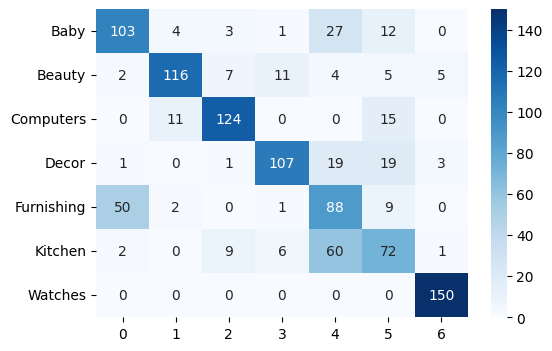

In [213]:
fonctions_data.conf_mat_metrics(df_bert_pname_tf_tsne_km)

**description** - lemmatisée

In [136]:
# Variable dont on veut extraire les features
data_work['desc_lem'] = \
    data_work['desc_lem'].fillna('').astype(str)
df_desc_lem = data_work['desc_lem']

**Modelisation**

In [137]:
# Instanciation du modèle
bert_desc_lem = SentenceTransformer('roberta-large')
# Encodage
vector_roberta_desc_lem = \
    bert_desc_lem.encode(df_desc_lem, show_progress_bar=False)

No sentence-transformers model found with name C:\Users\yanni/.cache\torch\sentence_transformers\roberta-large. Creating a new one with MEAN pooling.
Some weights of RobertaModel were not initialized from the model checkpoint at C:\Users\yanni/.cache\torch\sentence_transformers\roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [138]:
vector_roberta_desc_lem

array([[ 0.13219593,  0.13296142, -0.16766298, ..., -0.03023243,
         0.21516581,  0.22969559],
       [ 0.06780027,  0.04406194, -0.2635082 , ...,  0.10796814,
         0.32131448,  0.2160854 ],
       [ 0.09092533,  0.06303669, -0.23283333, ...,  0.12606661,
         0.24960145,  0.3056344 ],
       ...,
       [ 0.16384974, -0.03307249, -0.3026373 , ...,  0.19631582,
        -0.04838611, -0.02835465],
       [ 0.13173246, -0.00418322, -0.23444536, ...,  0.12524909,
         0.11137257, -0.03057999],
       [ 0.10344062,  0.02197616, -0.2601143 , ...,  0.109731  ,
        -0.00935114, -0.06204622]], dtype=float32)

In [140]:
# Dataframe pour réduction de dimension
df_vector_bert_desc_lem = pd.DataFrame(vector_roberta_desc_lem)

df_vector_bert_desc_lem_acp = fonctions_data.acp(df_vector_bert_desc_lem)
tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_bert_tf_desc_lem = tsne_red.fit_transform(df_vector_bert_desc_lem_acp)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_bert_tf_desc_lem.shape[1]+1, 1)]
df_bert_desc_lem_tf_tsne = pd.DataFrame(X_tsne_bert_tf_desc_lem, index=data_work.index, columns=columns)

Nombre de features après réduction ACP pour 99.0% de variance : 369


-----------------------------------------
 ARI  : 0.391
 Homogénéité  : 0.5182
-----------------------------------------


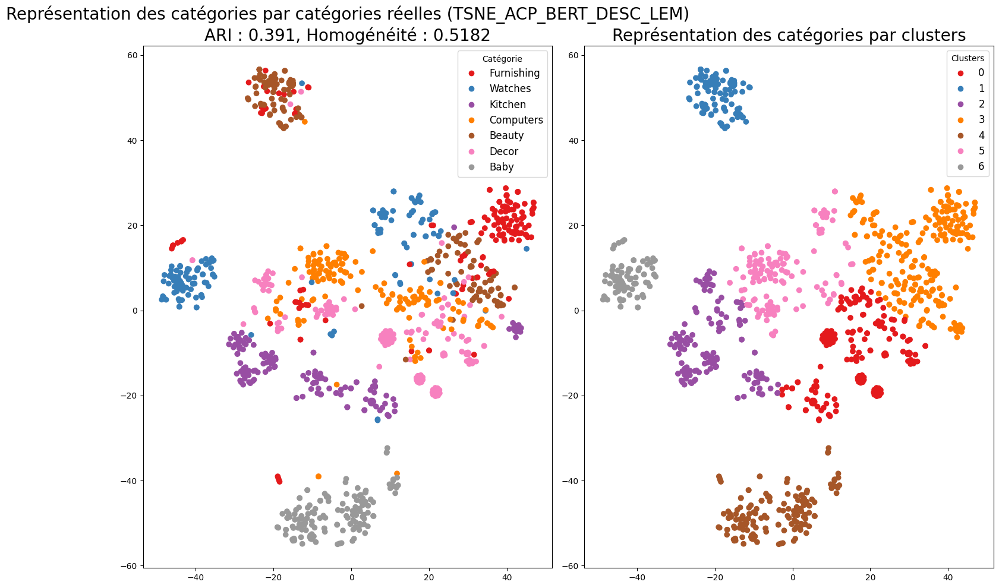

In [148]:
title = 'TSNE_ACP_BERT_DESC_LEM'

df_bert_desc_lem_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_bert_desc_lem_tf_tsne, data_cat) 
fonctions_data.affiche_projection_par_clusters(df_bert_desc_lem_tf_tsne_km, labels, ARI, Homogeneite, title)

**produit_specifications** - lemmatisée

In [142]:
# Variable dont on veut extraire les features
data_work['prod_spec_lem'] = \
    data_work['prod_spec_lem'].fillna('').astype(str)
df_prods_lem = data_work['prod_spec_lem']

**Modélisation**

In [143]:
# Instanciation du modèle
bert_prods_lem = SentenceTransformer('roberta-large')
# Encodage
vector_roberta_prods_lem = \
    bert_prods_lem.encode(df_prods_lem, show_progress_bar=False)

No sentence-transformers model found with name C:\Users\yanni/.cache\torch\sentence_transformers\roberta-large. Creating a new one with MEAN pooling.
Some weights of RobertaModel were not initialized from the model checkpoint at C:\Users\yanni/.cache\torch\sentence_transformers\roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [144]:
vector_roberta_prods_lem

array([[ 0.23720412, -0.20199165, -0.14418574, ..., -0.12327318,
         0.0381667 ,  0.10098483],
       [ 0.13280065, -0.12202819, -0.25144374, ...,  0.03208804,
         0.09513631,  0.10217821],
       [ 0.17613137, -0.1258876 , -0.26937947, ..., -0.01436785,
         0.03875981,  0.17766756],
       ...,
       [ 0.30604035, -0.03538117, -0.23064789, ..., -0.08283453,
         0.14643477,  0.1700236 ],
       [ 0.23717573, -0.07844844, -0.19513683, ..., -0.10321238,
         0.1833131 ,  0.19972135],
       [ 0.3039556 , -0.03547793, -0.23775563, ..., -0.07354901,
        -0.00743082,  0.07031865]], dtype=float32)

In [145]:
# Dataframe pour réduction de dimension
df_vector_bert_prods_lem = pd.DataFrame(vector_roberta_prods_lem)

df_vector_bert_prods_lem_acp = fonctions_data.acp(df_vector_bert_prods_lem)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_bert_tf_prods_lem = tsne_red.fit_transform(df_vector_bert_prods_lem_acp)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_bert_tf_prods_lem.shape[1]+1, 1)]
df_bert_prods_lem_tf_tsne = pd.DataFrame(X_tsne_bert_tf_prods_lem, index=data_work.index, columns=columns)

Nombre de features après réduction ACP pour 99.0% de variance : 328


-----------------------------------------
 ARI  : 0.5683
 Homogénéité  : 0.6724
-----------------------------------------


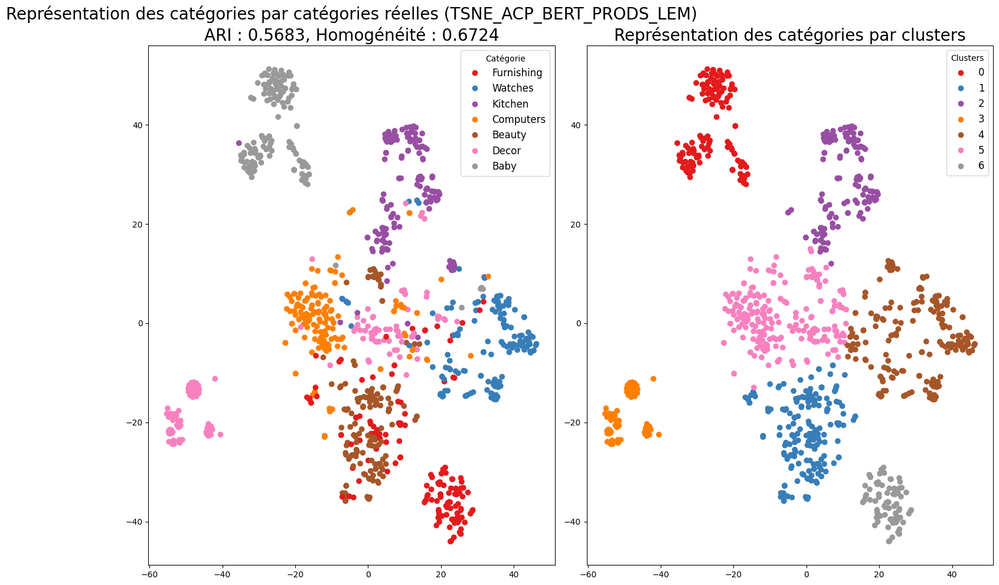

In [147]:
title = 'TSNE_ACP_BERT_PRODS_LEM'
df_bert_prods_lem_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_bert_prods_lem_tf_tsne, data_cat) 
fonctions_data.affiche_projection_par_clusters(df_bert_prods_lem_tf_tsne_km, labels, ARI, Homogeneite, title)

**produit_specifications** - racinisée

In [149]:
# Variable dont on veut extraire les features
data_work['prod_spec_stem'] = \
    data_work['prod_spec_stem'].fillna('').astype(str)
df_prods_stem = data_work['prod_spec_stem']

**Modélisation**

In [150]:
# Instanciation du modèle
bert_prods_stem = SentenceTransformer('roberta-large')
# Encodage
vector_roberta_prods_stem = \
    bert_prods_stem.encode(df_prods_stem, show_progress_bar=False)

No sentence-transformers model found with name C:\Users\yanni/.cache\torch\sentence_transformers\roberta-large. Creating a new one with MEAN pooling.
Some weights of RobertaModel were not initialized from the model checkpoint at C:\Users\yanni/.cache\torch\sentence_transformers\roberta-large and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [151]:
vector_roberta_prods_stem

array([[ 0.1711503 , -0.19407022, -0.13797437, ...,  0.08570353,
         0.19117   ,  0.16879429],
       [ 0.13674174, -0.1645638 , -0.16638348, ...,  0.19445874,
         0.21972704,  0.18423295],
       [ 0.20943993, -0.16969097, -0.22600903, ...,  0.17844562,
         0.20841314,  0.19421141],
       ...,
       [ 0.2292815 , -0.1813185 , -0.19545901, ...,  0.1064876 ,
         0.23404373,  0.18335947],
       [ 0.1788721 , -0.18727893, -0.16460164, ...,  0.0953389 ,
         0.25018314,  0.19246055],
       [ 0.27091256, -0.18354705, -0.14472236, ...,  0.03473605,
         0.09458712,  0.17482321]], dtype=float32)

In [152]:
# Dataframe pour réduction de dimension
df_vector_bert_prods_stem = pd.DataFrame(vector_roberta_prods_stem)

df_vector_bert_prods_stem_acp = fonctions_data.acp(df_vector_bert_prods_stem)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_bert_tf_prods_stem = tsne_red.fit_transform(df_vector_bert_prods_stem_acp)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_bert_tf_prods_stem.shape[1]+1, 1)]
df_bert_prods_stem_tf_tsne = pd.DataFrame(X_tsne_bert_tf_prods_stem, index=data_work.index, columns=columns)

Nombre de features après réduction ACP pour 99.0% de variance : 336


-----------------------------------------
 ARI  : 0.508
 Homogénéité  : 0.6114
-----------------------------------------


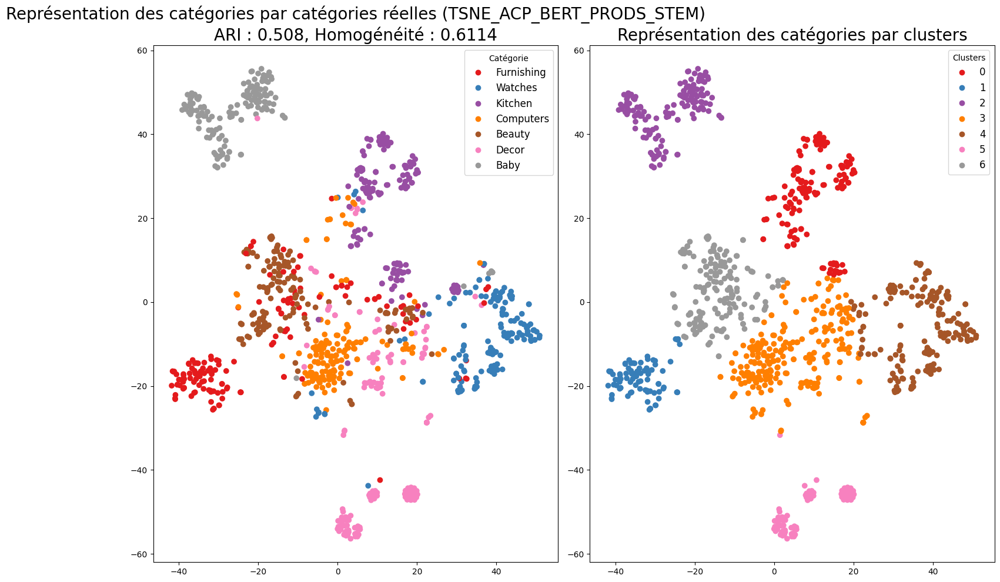

In [153]:
title = 'TSNE_ACP_BERT_PRODS_STEM'
df_bert_prods_stem_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_bert_prods_stem_tf_tsne, data_cat) 
fonctions_data.affiche_projection_par_clusters(df_bert_prods_stem_tf_tsne_km, labels, ARI, Homogeneite, title)

### <span style='background:orange'>4.5. USE</span>

**description** - lemmatisée

In [48]:
# Suppression des waring, info
tf.get_logger().setLevel('ERROR')

In [49]:
use_module_url = 'https://tfhub.dev/google/universal-sentence-encoder/3'

**Modelisation**

In [50]:
# Chargement du modèle
use_model_prod_orig = hub.load(use_module_url)
print('Module %s Chargé' % use_module_url)

Module https://tfhub.dev/google/universal-sentence-encoder/3 Chargé


In [190]:
vector_use_desc_lem = use_model_prod_orig(df_desc_lem)

In [193]:
vector_use_desc_lem_outputs = vector_use_desc_lem['outputs'].numpy()
vector_use_desc_lem_outputs

array([[-0.05436435, -0.05044528,  0.01847512, ...,  0.041538  ,
         0.05256531, -0.03384351],
       [-0.03168174, -0.02172026, -0.01253382, ...,  0.02603686,
         0.04548982,  0.03226286],
       [-0.05487311, -0.00230782, -0.033884  , ...,  0.04553097,
        -0.04454522, -0.04658087],
       ...,
       [-0.03667296, -0.06210892, -0.06787084, ...,  0.00351099,
        -0.02656717, -0.03408793],
       [-0.01628286, -0.05467406,  0.015009  , ...,  0.02106182,
        -0.01692948, -0.03201395],
       [-0.05165637, -0.04829301, -0.00482606, ...,  0.04193441,
        -0.0099245 , -0.01465913]], dtype=float32)

**Reduction de dimension (TSNE)**

In [194]:
# Dataframe pour réduction de dimension
df_vector_use_desc_lem_outputs = pd.DataFrame(vector_use_desc_lem_outputs)

df_vector_use_desc_lem_acp = fonctions_data.acp(df_vector_use_desc_lem_outputs)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_desc_lem = tsne_red.fit_transform(df_vector_use_desc_lem_acp)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_desc_lem.shape[1]+1, 1)]
df_use_desc_use_tf_tsne = pd.DataFrame(X_tsne_use_tf_desc_lem, index=data_work.index, columns=columns)

Nombre de features après réduction ACP pour 99.0% de variance : 320


-----------------------------------------
 ARI  : 0.4558
 Homogénéité  : 0.5838
-----------------------------------------


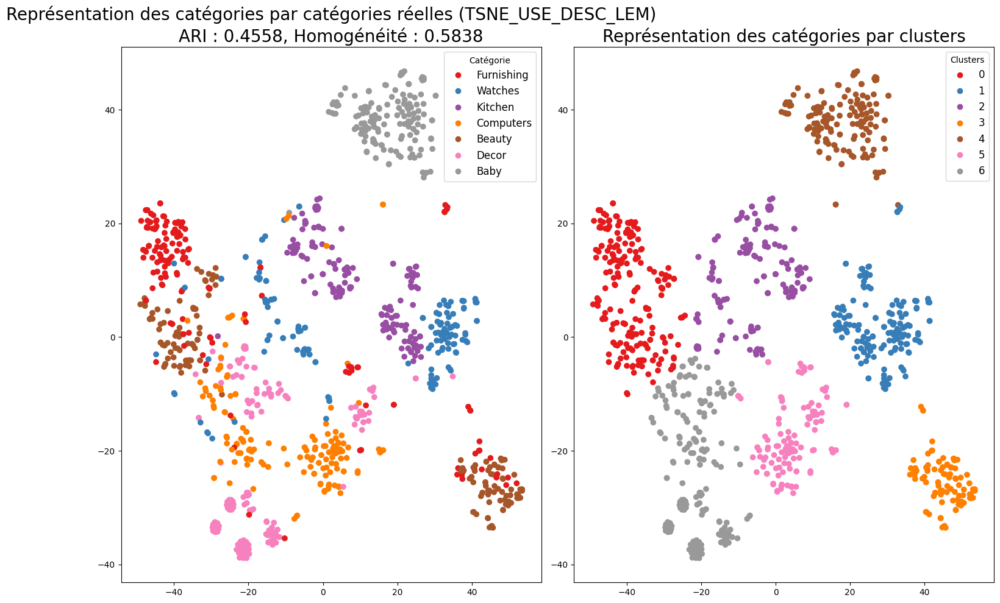

In [195]:
title = 'TSNE_USE_DESC_LEM'
df_use_desc_lem_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_use_desc_use_tf_tsne, data_cat) 
fonctions_data.affiche_projection_par_clusters(df_use_desc_lem_tf_tsne_km, labels, ARI, Homogeneite, title)

**description** - racinisée

In [309]:
vector_use_desc_stem = use_model_prod_orig(data_desc_stem)

**Reduction de dimension (TSNE)**

In [310]:
tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_desc_stem = tsne_red.fit_transform(vector_use_desc_stem)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_desc_stem.shape[1]+1, 1)]
df_use_desc_stem_tf_tsne = pd.DataFrame(X_tsne_use_tf_desc_stem, index=data_work.index, columns=columns)

In [312]:
title = 'TSNE_USE_DESC_STEM'
df_use_desc_stem_tf_tsne_km, ARI, Homogeneite, labels =  kmeans(df_use_desc_stem_tf_tsne, data_cat) 

-----------------------------------------
 ARI  : 0.4275
 Homogénéité  : 0.5654
-----------------------------------------


**description** - brut

In [333]:
vector_use_desc = use_model_prod_orig(data_work['description'])

**Reduction de dimension (TSNE)**

In [334]:
tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_desc = tsne_red.fit_transform(vector_use_desc)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_desc.shape[1]+1, 1)]
df_use_desc_tf_tsne = pd.DataFrame(X_tsne_use_tf_desc, index=data_work.index, columns=columns)

In [335]:
df_use_desc_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_use_desc_tf_tsne, data_cat) 

-----------------------------------------
 ARI  : 0.4467
 Homogénéité  : 0.5819
-----------------------------------------


**description** - brut

In [314]:
vector_use_desc = use_model_prod_orig(data_desc)

**Reduction de dimension (TSNE)**

In [315]:
tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_desc = tsne_red.fit_transform(vector_use_desc)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_desc.shape[1]+1, 1)]
df_use_desc_tf_tsne = pd.DataFrame(X_tsne_use_tf_desc, index=data_work.index, columns=columns)

In [316]:
#title = 'TSNE_USE_DESC_STEM'
df_use_desc_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_use_desc_tf_tsne, data_cat) 

-----------------------------------------
 ARI  : 0.4467
 Homogénéité  : 0.5819
-----------------------------------------


**nom_produit** - lemmatisée

In [317]:
vector_use_prod_lem = use_model_prod_orig(data_prod_lem)

**Reduction de dimension (TSNE)**

In [318]:
tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_prod_lem = tsne_red.fit_transform(vector_use_prod_lem)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_prod_lem.shape[1]+1, 1)]
df_use_prod_lem_tf_tsne = pd.DataFrame(X_tsne_use_tf_prod_lem, index=data_work.index, columns=columns)

In [319]:
df_use_prod_lem_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_use_prod_lem_tf_tsne, data_cat) 

-----------------------------------------
 ARI  : 0.579
 Homogénéité  : 0.6429
-----------------------------------------


**nom_produit** - racinisée

In [320]:
vector_use_prod_stem = use_model_prod_orig(data_prod_stem)

**Reduction de dimension (TSNE)**

In [321]:
tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_prod_stem = tsne_red.fit_transform(vector_use_prod_stem)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_prod_stem.shape[1]+1, 1)]
df_use_prod_stem_tf_tsne = pd.DataFrame(X_tsne_use_tf_prod_stem, index=data_work.index, columns=columns)

In [322]:
df_use_prod_stem_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_use_prod_stem_tf_tsne, data_cat) 

-----------------------------------------
 ARI  : 0.5915
 Homogénéité  : 0.6284
-----------------------------------------


**nom_produit** - nettoyé

In [327]:
vector_use_prod_cl = use_model_prod_orig(data_work['pname_clean'])

**Reduction de dimension (TSNE)**

In [328]:
tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_prod_cl = tsne_red.fit_transform(vector_use_prod_cl)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_prod_cl.shape[1]+1, 1)]
df_use_prod_cl_tf_tsne = pd.DataFrame(X_tsne_use_tf_prod_cl, index=data_work.index, columns=columns)

In [329]:
df_use_prod_cl_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_use_prod_cl_tf_tsne, data_cat) 

-----------------------------------------
 ARI  : 0.579
 Homogénéité  : 0.6429
-----------------------------------------


**nom_produit** - brut

In [51]:
vector_use_prod = use_model_prod_orig(data_work['product_name'])

In [52]:
vector_use_prod_outputs = vector_use_prod['outputs'].numpy()
vector_use_prod_outputs

array([[ 0.05646455, -0.0166991 , -0.0370861 , ..., -0.01305964,
         0.04983915,  0.06384217],
       [ 0.00599405,  0.05433533, -0.00869234, ..., -0.00258876,
         0.06814882,  0.02568774],
       [ 0.02507095,  0.00259155, -0.0042601 , ..., -0.00587555,
         0.05306112, -0.00711143],
       ...,
       [ 0.05488612,  0.05462695,  0.03137715, ..., -0.03242321,
         0.07352425, -0.06536923],
       [ 0.05647468,  0.03322315,  0.0616175 , ..., -0.02976299,
        -0.01674185, -0.0215883 ],
       [ 0.01983393,  0.06305396,  0.07477679, ..., -0.006964  ,
        -0.02285352, -0.01964251]], dtype=float32)

**Reduction de dimension (TSNE)**

In [57]:
# Dataframe pour réduction de dimension
df_vector_use_prod_outputs = pd.DataFrame(vector_use_prod_outputs)

df_vector_use_prod_acp = fonctions_data.acp(df_vector_use_prod_outputs)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_prod = tsne_red.fit_transform(df_vector_use_prod_acp)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_prod.shape[1]+1, 1)]
df_use_prod_tf_tsne = pd.DataFrame(X_tsne_use_tf_prod, index=data_work.index, columns=columns)

Nombre de features après réduction ACP pour 99.0% de variance : 301


-----------------------------------------
 ARI  : 0.7071
 Homogénéité  : 0.7503
-----------------------------------------


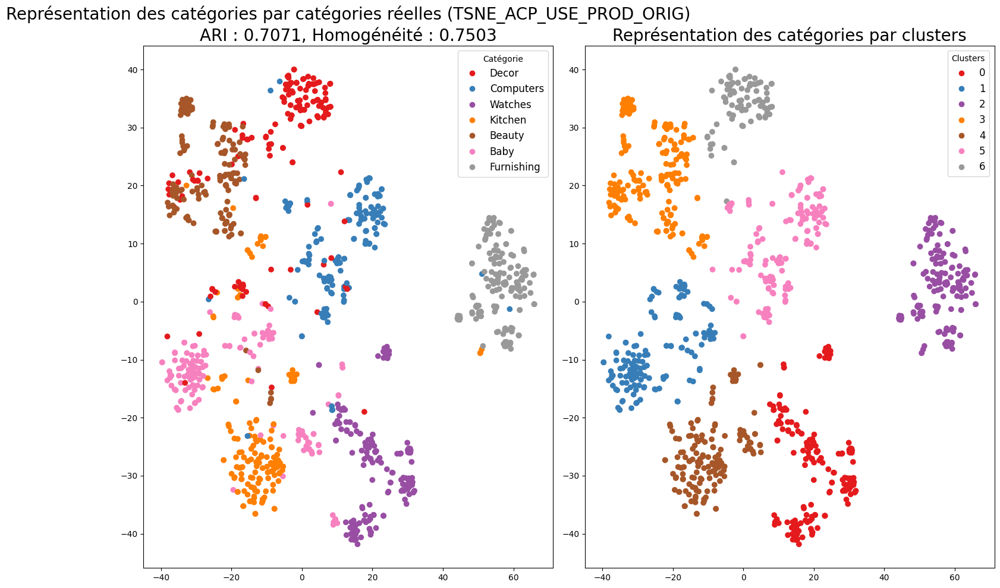

In [59]:
title = 'TSNE_ACP_USE_PROD_ORIG'
df_use_prod_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_use_prod_tf_tsne, data_cat) 
fonctions_data.affiche_projection_par_clusters(df_use_prod_tf_tsne_km, labels, ARI, Homogeneite, title)

- Le score ARI est très bon (**0.71**), ainsi que le degré d'homogénéité (**0.75**)
- La combinaison **USE + TfIdfVectorizer + ACP + nom_produit + original**, parvient à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (85%).

Clusters,Nombre,%
0,164,15.620000
1,152,14.480000
2,155,14.760000
3,187,17.810000
4,149,14.190000
5,151,14.380000
6,92,8.760000


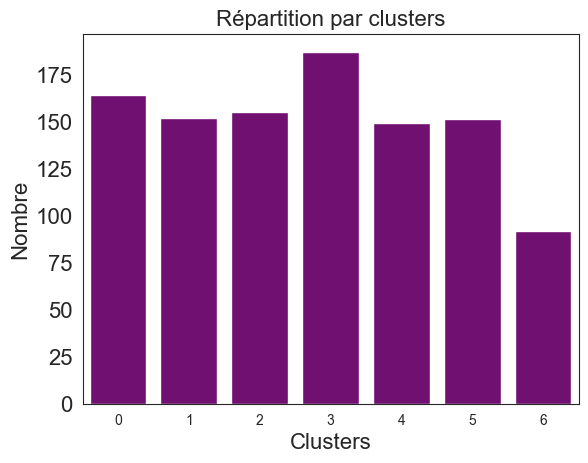

In [460]:
fonctions_data.affiche_repartition_par_clusters(labels)

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.967391,0.593333,0.735537,150.000000
1,0.926667,0.926667,0.926667,150.000000
2,0.896341,0.980000,0.936306,150.000000
3,0.763514,0.753333,0.758389,150.000000
4,0.765957,0.960000,0.852071,150.000000
5,0.712418,0.726667,0.719472,150.000000
6,0.967742,1.000000,0.983607,150.000000
accuracy,0.848571,0.848571,0.848571,0.848571
macro avg,0.857147,0.848571,0.844578,1050.000000
weighted avg,0.857147,0.848571,0.844578,1050.000000


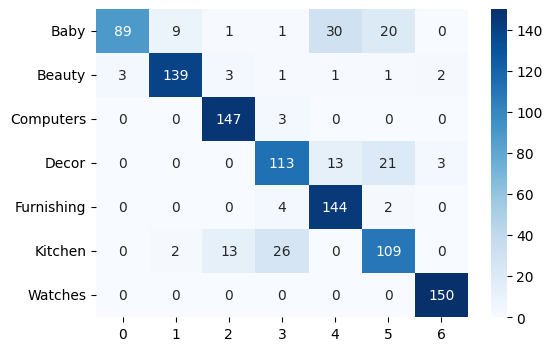

In [340]:
fonctions_data.conf_mat_metrics(df_use_prod_tf_tsne_km)

**produit_specifications** - lemmatisée

**Modelisation**

In [204]:
vector_use_prods_lem = use_model_prod_orig(df_prods_lem)

In [205]:
vector_use_prods_lem_outputs = vector_use_prods_lem['outputs'].numpy()
vector_use_prods_lem_outputs

array([[-0.02822893, -0.05866568, -0.02234631, ...,  0.03051771,
         0.02722263, -0.05520183],
       [-0.00571687, -0.05579138, -0.04014564, ...,  0.01834492,
        -0.03161055, -0.05485104],
       [-0.01173704, -0.05631636, -0.0303089 , ..., -0.01738444,
        -0.01790421, -0.05552733],
       ...,
       [-0.04879308, -0.05809372, -0.04506187, ..., -0.01770598,
        -0.04770849, -0.05779939],
       [-0.05273878, -0.05523444, -0.04375966, ..., -0.03739665,
        -0.02708524, -0.05505388],
       [-0.02401044, -0.06926043, -0.03277843, ..., -0.03027704,
        -0.01612329, -0.0470394 ]], dtype=float32)

**Reduction de dimension (TSNE)**

In [206]:
# Dataframe pour réduction de dimension
df_vector_use_prods_lem_outputs = pd.DataFrame(vector_use_prods_lem_outputs)

df_vector_bert_prods_lem_acp = fonctions_data.acp(df_vector_use_prods_lem_outputs)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_prods_lem = tsne_red.fit_transform(df_vector_bert_prods_lem_acp)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_prods_lem.shape[1]+1, 1)]
df_use_prods_use_tf_tsne = pd.DataFrame(X_tsne_use_tf_prods_lem, index=data_work.index, columns=columns)

Nombre de features après réduction ACP pour 99.0% de variance : 261


-----------------------------------------
 ARI  : 0.6375
 Homogénéité  : 0.7136
-----------------------------------------


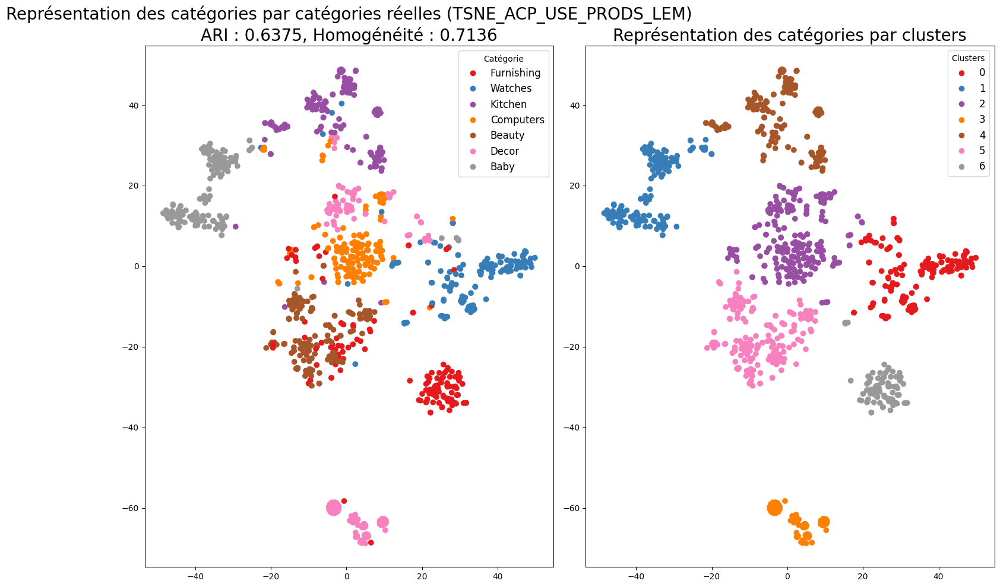

In [207]:
title = 'TSNE_ACP_USE_PRODS_LEM'
df_use_prods_lem_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_use_prods_use_tf_tsne, data_cat) 
fonctions_data.affiche_projection_par_clusters(df_use_prods_lem_tf_tsne_km, labels, ARI, Homogeneite, title)

- Le score ARI est assez bon (0.64), ainsi que le degré d'homogénéité (0.71)
- La combinaison Word2Vec + TfIdfVectorizer + ACP + description + lemmatisés , parvient à peu près à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (81%).

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.943182,0.553333,0.697479,150.000000
1,0.840764,0.880000,0.859935,150.000000
2,0.902597,0.926667,0.914474,150.000000
3,0.588496,0.886667,0.707447,150.000000
4,0.746193,0.980000,0.847262,150.000000
5,0.973684,0.493333,0.654867,150.000000
6,0.940789,0.953333,0.947020,150.000000
accuracy,0.810476,0.810476,0.810476,0.810476
macro avg,0.847958,0.810476,0.804069,1050.000000
weighted avg,0.847958,0.810476,0.804069,1050.000000


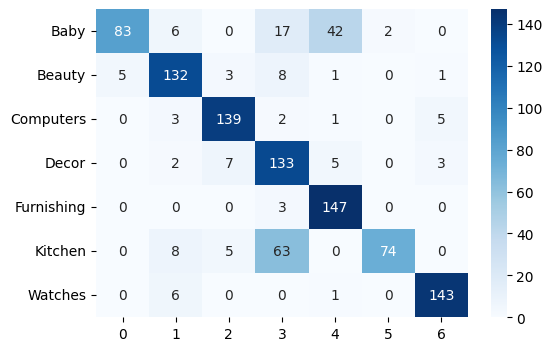

In [187]:
fonctions_data.conf_mat_metrics(df_use_prods_lem_tf_tsne_km)

**produit_specifications** - racinisée

**Modélisation**

In [183]:
vector_use_prods_stem = use_model_prod_orig(df_prods_stem)

In [184]:
vector_use_prods_stem_outputs = vector_use_prods_stem['outputs'].numpy()
vector_use_prods_stem_outputs

array([[-0.06058725, -0.06253048, -0.00987435, ..., -0.04779598,
         0.04090021, -0.05406416],
       [-0.05445528, -0.05512849, -0.00959209, ..., -0.04017502,
         0.02098398, -0.0502905 ],
       [-0.05538512, -0.05824359,  0.00124697, ..., -0.05235316,
         0.03564195, -0.05632622],
       ...,
       [-0.06246294, -0.06260453, -0.01501263, ..., -0.03743516,
        -0.04009168, -0.06115977],
       [-0.0585923 , -0.05816854, -0.00144888, ..., -0.03643528,
         0.01375531, -0.05596569],
       [-0.04108105, -0.0686003 , -0.00526175, ..., -0.0486479 ,
        -0.01494744, -0.03819256]], dtype=float32)

In [188]:
# Dataframe pour réduction de dimension
df_vector_use_prods_stem_outputs = pd.DataFrame(vector_use_prods_stem_outputs)

df_vector_bert_prods_stem_acp = fonctions_data.acp(df_vector_use_prods_stem_outputs)

tsne_red = TSNE(n_components=2, n_iter=2000, random_state=0, perplexity=30)
X_tsne_use_tf_prods_stem = tsne_red.fit_transform(vector_use_prods_stem_outputs)
    
columns = ['DIM' + str(c) for c in range(1, X_tsne_use_tf_prods_stem.shape[1]+1, 1)]
df_use_prods_use_tf_tsne = pd.DataFrame(X_tsne_use_tf_prods_stem, index=data_work.index, columns=columns)

Nombre de features après réduction ACP pour 99.0% de variance : 258


-----------------------------------------
 ARI  : 0.5896
 Homogénéité  : 0.713
-----------------------------------------


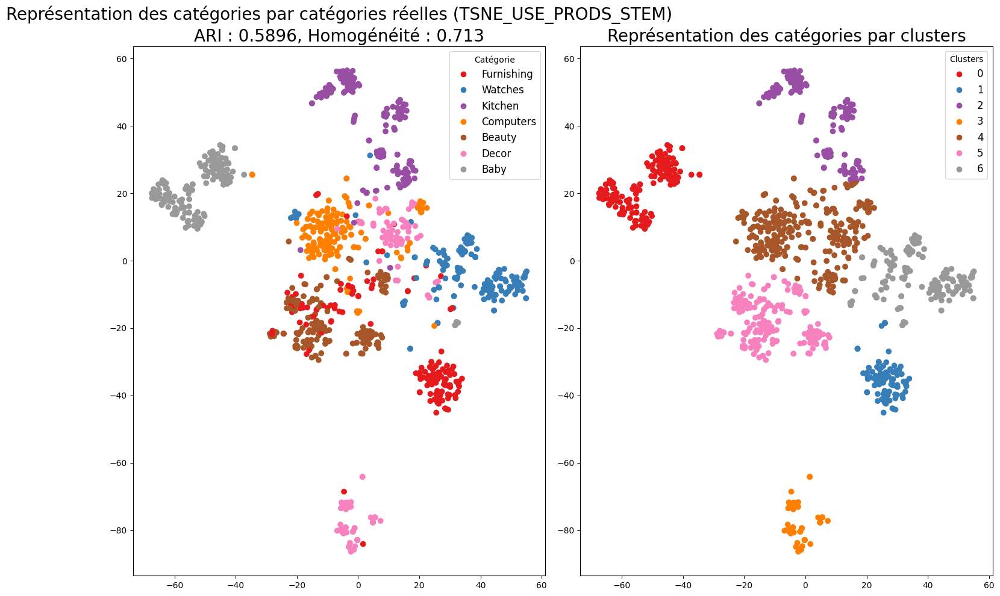

In [189]:
title = 'TSNE_USE_PRODS_STEM'
df_use_prods_stem_tf_tsne_km, ARI, Homogeneite, labels =  fonctions_data.kmeans(df_use_prods_use_tf_tsne, data_cat) 
fonctions_data.affiche_projection_par_clusters(df_use_prods_stem_tf_tsne_km, labels, ARI, Homogeneite, title)

- Le score ARI est assez bon (0.59), ainsi que le degré d'homogénéité (0.71)
- La combinaison Word2Vec + TfIdfVectorizer + ACP + description + lemmatisés , ne parvient pas exactement à retrouver les 7 catégories comme le souhaite notre client. Il reste à mesurer la qualité de cette catégorisation (79 %).

**Matrice de confusion (permutation groupes*Clusters) avec l'accuracy**

,precision,recall,f1-score,support
0,0.912088,0.553333,0.688797,150.000000
1,0.869281,0.886667,0.877888,150.000000
2,0.992308,0.860000,0.921429,150.000000
3,0.512915,0.926667,0.660333,150.000000
4,0.700000,0.840000,0.763636,150.000000
5,0.974359,0.506667,0.666667,150.000000
6,0.986395,0.966667,0.976431,150.000000
accuracy,0.791429,0.791429,0.791429,0.791429
macro avg,0.849621,0.791429,0.793597,1050.000000
weighted avg,0.849621,0.791429,0.793597,1050.000000


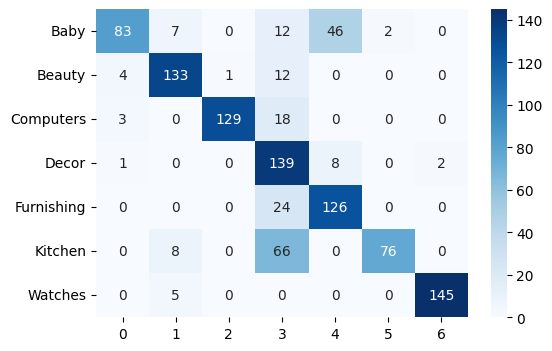

In [202]:
fonctions_data.conf_mat_metrics(df_use_prods_stem_tf_tsne_km)

**Bilan Classifiaction - Partie Texte (NLP)**

En se basant sur ‘product-name’, le meilleur résultat obtenu avec USE5 : ARI 0.70, accuracy 0.85